In [1]:
import scanpy as sc
import numpy as np
import pandas as pd
import anndata 
from scipy.sparse import csr_matrix
import matplotlib.pyplot as plt

import seaborn as sns
from sklearn.preprocessing import scale
from sklearn.decomposition import PCA
from sklearn.neighbors import NearestNeighbors

# Para pseudotime con PAGA (Scanpy tiene métodos similares a Monocle3)
import scanpy.external as sce

import palantir
import palantir.utils as utils
from sklearn.decomposition import PCA
from palantir.presults import compute_gene_trends

from pygam import GAM, s
from statsmodels.stats.multitest import multipletests
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import pdist, squareform

from tqdm import tqdm
from sklearn.preprocessing import StandardScaler

SEED = 42
sc.settings.seed = SEED
np.random.seed(SEED)
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)

# The environment is in conda bash in Windows

In [2]:
import loompy
# 1. Abrir archivo loom
ds = loompy.connect("/lustre1/project/stg_00135/Cecilia/Data/SCENIC/all.both.patients_pySCENIC.loom", mode='r', validate=False)

# 2. Extraer matriz genes x células
X = ds[:, :]

# 3. Extraer metadatos de genes (rows)
var = pd.DataFrame({'Gene': ds.ra['Gene']})

# 4. Extraer metadatos de células (columns)
obs = pd.DataFrame({key: ds.ca[key] for key in ds.ca.keys()})

# 5. Guardar regulones (tuplas) en uns
regulons_tuples = ds.ra['Regulons']

ds.close()

# Para obs y var:
obs.index = obs.index.astype(str)
var.index = var.index.astype(str)
# 6. Crear objeto AnnData
adata = anndata.AnnData(X=X.T, var=var, obs=obs)

# 7. Guardar regulones en adata.uns
adata.uns['Regulons_tuples'] = regulons_tuples

# 8. Columnas complejas para mover a .obsm
cols_complex = ['Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC']

# 9. Mover columnas complejas de obs a obsm
for col in cols_complex:
    adata.obsm[col] = np.array(adata.obs[col].tolist(), dtype=object) 
    del adata.obs[col]

# 10. Verificación
adata


AnnData object with n_obs × n_vars = 72733 × 26156
    obs: 'AvgDistanceToRef', 'CellID', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    var: 'Gene'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [3]:
adata.obs.set_index('CellID', inplace=True)
adata.var.set_index('Gene', inplace=True)

# Segmented cells from l1

In [4]:
cd8_adata = adata[adata.obs['predicted.celltype.l1'] == "CD8 T"].copy()

In [5]:
cd8_adata

AnnData object with n_obs × n_vars = 15019 × 26156
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [6]:
cd8_adata.obs['subsample'].value_counts()

subsample
c. 4 Months P116RS         4151
d. Pre-Treatment P123RS    2599
b. 1 Week P116RS           2554
f. 4 Months P123RS         2474
a. Pre-Treatment P116RS    1786
e. 1 Week P123RS           1455
Name: count, dtype: int64

In [7]:
# Patient p123
adata_p123 = cd8_adata[cd8_adata.obs["subsample"].str.contains("P123RS")].copy()

In [8]:
adata_p123

AnnData object with n_obs × n_vars = 6528 × 26156
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [9]:
# check if CD14 gene is in var
if "CD14" in adata_p123.var_names:
    # keep the cells that do not express CD14
    adata_p123 = adata_p123[adata_p123[:, "CD14"].X.toarray().flatten() == 0, :].copy()
else:
    print("El gen CD14 no está en adata_p123.var_names")

In [10]:
# check if CD14 gene is in var
if "CD4" in adata_p123.var_names:
    # keep the cells that do not express CD14
    adata_p123 = adata_p123[adata_p123[:, "CD4"].X.toarray().flatten() == 0, :].copy()
else:
    print("El gen CD4 no está en adata_p123.var_names")

In [11]:
adata_p123 = adata_p123[adata_p123.obs["predicted.celltype.l2"] != "CD14 Mono"].copy()
adata_p123 = adata_p123[adata_p123.obs["predicted.celltype.l2"] != "CD4 TCM"].copy()

adata_p123.obs["predicted.celltype.l2"].value_counts()

predicted.celltype.l2
CD8 TEM              5512
CD8 Naive             607
CD8 TCM                44
CD8 Proliferating      16
dnT                     6
CD4 TEM                 4
CD4 Naive               3
Platelet                2
Name: count, dtype: int64

In [12]:
adata_p123

AnnData object with n_obs × n_vars = 6194 × 26156
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    uns: 'Regulons_tuples'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC'

In [13]:
adata_p123 = adata_p123[adata_p123.obs["percent.mito"] <= 5].copy()

<Axes: >

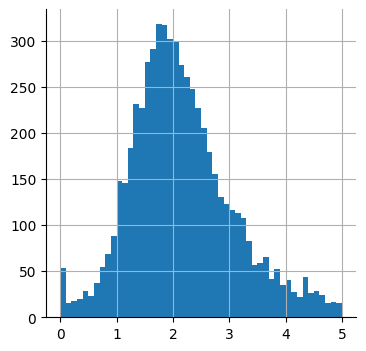

In [14]:
adata_p123.obs["percent.mito"].hist(bins=50)

In [15]:
sc.pp.filter_genes(adata_p123, min_cells=3)

filtered out 8580 genes that are detected in less than 3 cells


In [16]:
# Normalizing to median total counts
sc.pp.normalize_total(adata_p123)
# Logarithmize the data
sc.pp.log1p(adata_p123)

normalizing counts per cell
    finished (0:00:00)


In [17]:
sc.pp.highly_variable_genes(adata_p123, flavor="seurat", n_top_genes=1500)

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


In [18]:
sc.pp.pca(adata_p123, n_comps=50)

computing PCA
    with n_comps=50
    finished (0:00:01)


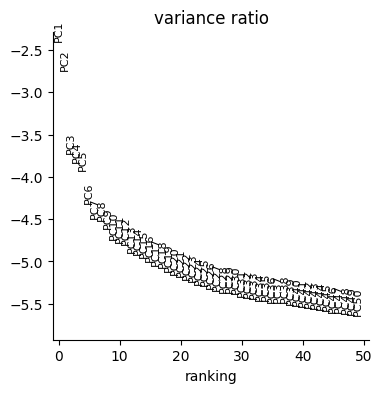

In [19]:
sc.pl.pca_variance_ratio(adata_p123, n_pcs=50, log=True)

In [20]:
sc.pp.neighbors(adata_p123)
sc.tl.umap(adata_p123)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:07)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:16)


In [21]:
adata_p123

AnnData object with n_obs × n_vars = 5934 × 17576
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

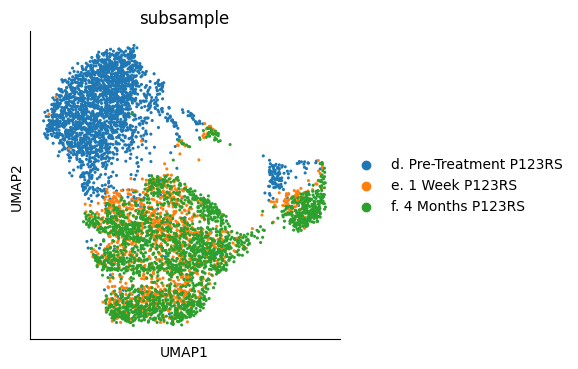

In [22]:
sc.settings.figdir = "/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P123_CD8/"
sc.pl.umap(
    adata_p123,
    color="subsample",
    # Setting a smaller point size to get prevent overlap
    size=20, save = '_subsample.pdf'
)

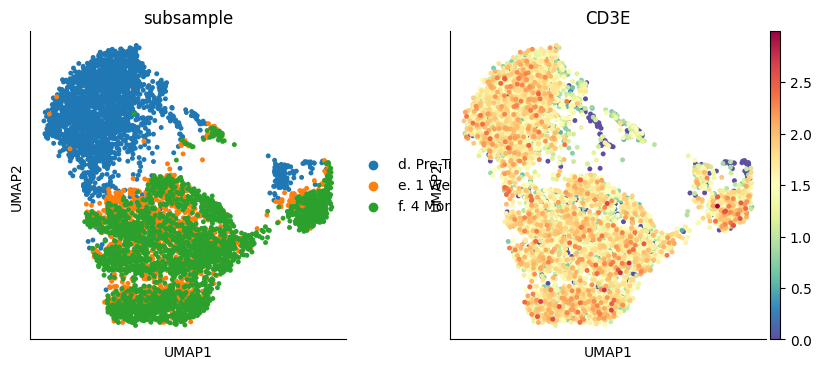

In [23]:
sc.pl.umap(
    adata_p123,
    color=["subsample", "CD3E"],
    # Setting a smaller point size to get prevent overlap
    size=50,
)

In [24]:
"""import harmonypy as hm


# Calcular PCA si no existe
if 'X_pca' not in adata_p123.obsm:
    sc.pp.pca(adata_p123, svd_solver='arpack')

# Corrección por lotes
ho = hm.run_harmony(adata_p123.obsm['X_pca'], adata_p123.obs, 'subsample')
adata_p123.obsm['X_pca_harmony'] = ho.Z_corr.T  # Transponer la matriz

# Recalcular vecinos, UMAP y clustering
sc.pp.neighbors(adata_p123, use_rep='X_pca_harmony')
sc.tl.umap(adata_p123)
sc.tl.leiden(adata_p123, key_added='clusters_harmony')

# Visualizar
sc.pl.umap(adata_p123, color=['subsample', 'clusters_harmony'], wspace=0.5)"""

"import harmonypy as hm\n\n\n# Calcular PCA si no existe\nif 'X_pca' not in adata_p123.obsm:\n    sc.pp.pca(adata_p123, svd_solver='arpack')\n\n# Corrección por lotes\nho = hm.run_harmony(adata_p123.obsm['X_pca'], adata_p123.obs, 'subsample')\nadata_p123.obsm['X_pca_harmony'] = ho.Z_corr.T  # Transponer la matriz\n\n# Recalcular vecinos, UMAP y clustering\nsc.pp.neighbors(adata_p123, use_rep='X_pca_harmony')\nsc.tl.umap(adata_p123)\nsc.tl.leiden(adata_p123, key_added='clusters_harmony')\n\n# Visualizar\nsc.pl.umap(adata_p123, color=['subsample', 'clusters_harmony'], wspace=0.5)"

running Leiden clustering


/tmp/ipykernel_2051411/3612633182.py:1: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata_p123, resolution = 1.0)


    finished: found 11 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


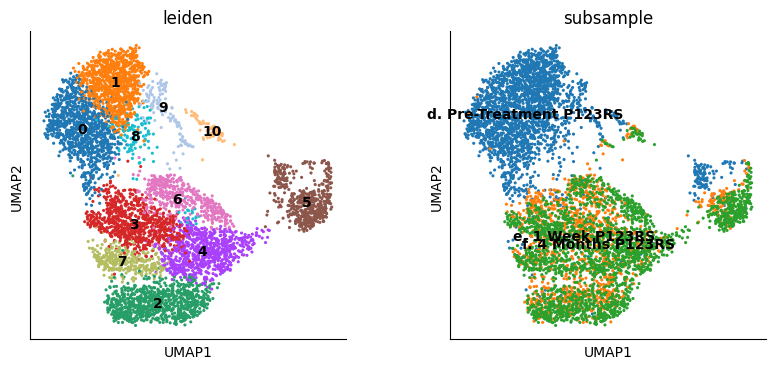

In [25]:
sc.tl.leiden(adata_p123, resolution = 1.0)
sc.pl.umap(adata_p123, color=["leiden", "subsample"], legend_loc="on data")

In [26]:
for res in [0.2, 0.5, 0.8, 1.0]:
    sc.tl.leiden(adata_p123, resolution=res, key_added=f"leiden_res_{res:.2f}")

running Leiden clustering
    finished: found 5 clusters and added
    'leiden_res_0.20', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_res_0.50', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 8 clusters and added
    'leiden_res_0.80', the cluster labels (adata.obs, categorical) (0:00:00)
running Leiden clustering
    finished: found 11 clusters and added
    'leiden_res_1.00', the cluster labels (adata.obs, categorical) (0:00:00)


In [27]:
adata_p123

AnnData object with n_obs × n_vars = 5934 × 17576
    obs: 'AvgDistanceToRef', 'RNA_MERGED_clusters', 'nCount_RNA', 'nGene', 'nUMI', 'percent.mito', 'predicted.celltype.l1', 'predicted.celltype.l2', 'subsample', 'leiden', 'leiden_res_0.20', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00'
    var: 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Regulons_tuples', 'log1p', 'hvg', 'pca', 'neighbors', 'umap', 'subsample_colors', 'leiden', 'leiden_colors', 'leiden_res_0.20', 'leiden_res_0.50', 'leiden_res_0.80', 'leiden_res_1.00'
    obsm: 'Clusterings', 'Embedding', 'Embeddings_X', 'Embeddings_Y', 'RegulonsAUC', 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

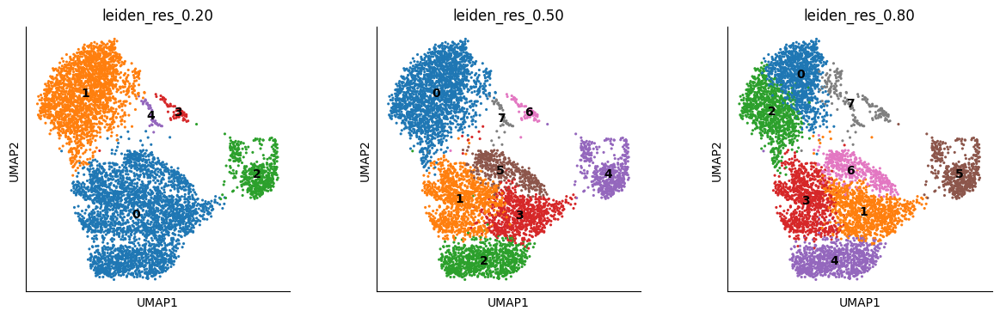

In [28]:
sc.pl.umap(
    adata_p123,
    color=["leiden_res_0.20", "leiden_res_0.50", "leiden_res_0.80"],
    legend_loc="on data",
)

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:08)


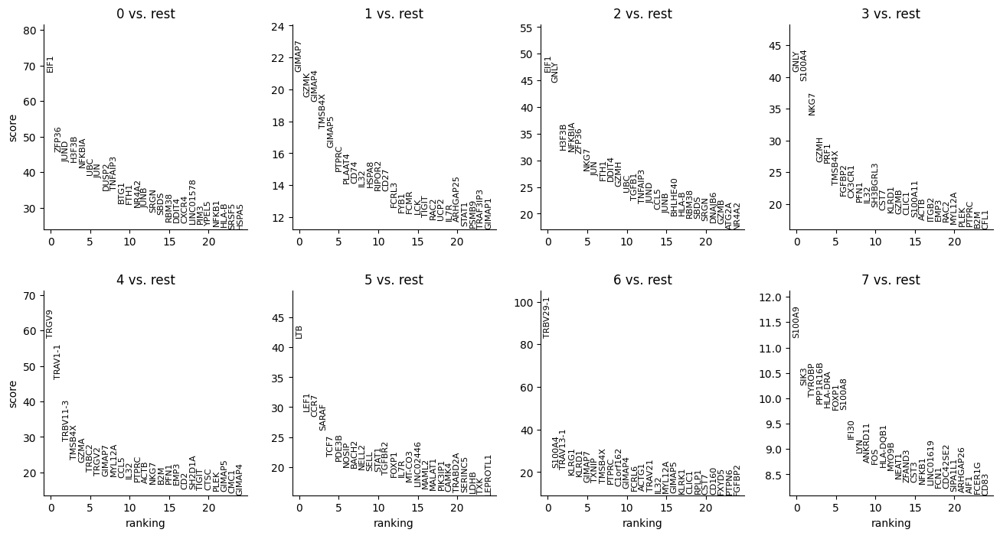

In [29]:
sc.tl.rank_genes_groups(adata_p123, "leiden_res_0.80", method="t-test")
sc.pl.rank_genes_groups(adata_p123, n_genes=25, sharey=False)

In [30]:
sc.tl.rank_genes_groups(adata_p123, groupby="leiden_res_0.20", method="wilcoxon")

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)


    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_leiden_res_0.20']`


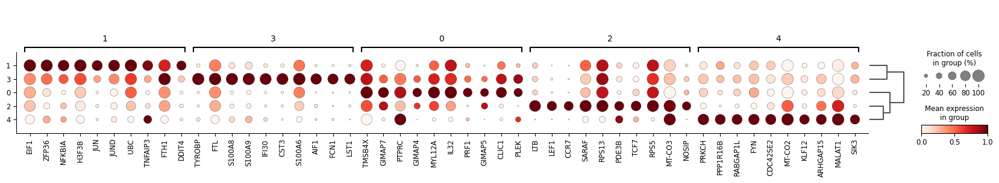

In [31]:
sc.pl.rank_genes_groups_dotplot(
    adata_p123, groupby="leiden_res_0.20", standard_scale="var", n_genes=10)

In [32]:
sc.get.rank_genes_groups_df(adata_p123, group="3").head(40)

,names,scores,logfoldchanges,pvals,pvals_adj
0,TYROBP,13.613253,4.995149,3.340385e-42,3.667707e-38
1,FTL,13.596972,2.026271,4.173540e-42,3.667707e-38
2,S100A8,12.976603,5.286771,1.660860e-38,9.730423e-35
3,S100A9,12.906640,4.324401,4.129268e-38,1.814400e-34
4,IFI30,12.420744,4.072901,2.016781e-35,7.089389e-32
5,CST3,12.377820,4.095175,3.445766e-35,1.009380e-31
6,S100A6,12.325213,1.770027,6.626751e-35,1.663882e-31
7,AIF1,11.617060,4.245994,3.375555e-31,7.416095e-28
8,FCN1,11.267752,4.575737,1.893434e-29,2.773250e-26
9,LST1,11.146259,4.353945,7.468020e-29,9.375566e-26


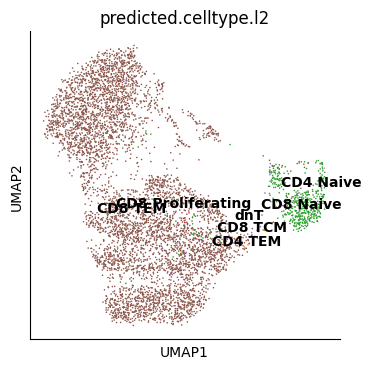

In [33]:
sc.pl.umap(adata_p123, color= ["predicted.celltype.l2"], legend_loc="on data", size=5)

In [34]:
adata_p123.obs["cell_type_lvl1"] = adata_p123.obs["leiden_res_0.20"].map(
    {
        "0": "Teff",
        "1": "Teff",
        "2": "Naive",
        "3": "Doublet",
        "4": "Quiescent"
    }
)

In [35]:
adata_p123.obs["cell_type_lvl1"].value_counts()


cell_type_lvl1
Teff         5316
Naive         511
Doublet        67
Quiescent      40
Name: count, dtype: int64

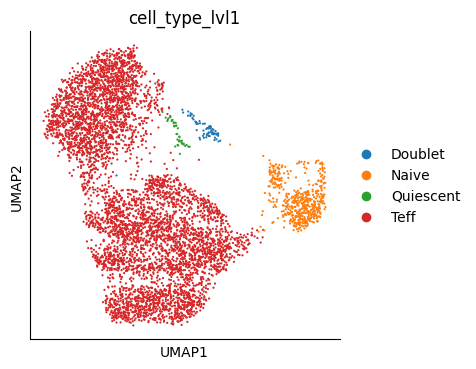

In [36]:
sc.pl.umap(adata_p123, color="cell_type_lvl1", size=10, save = '_celltypelvl1.pdf')


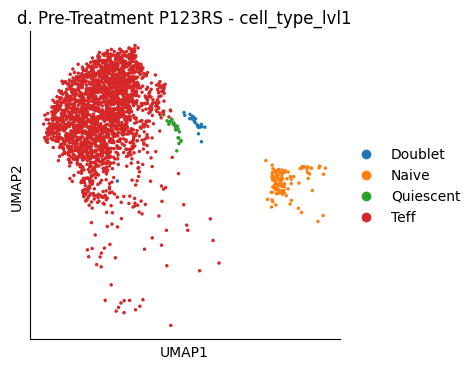

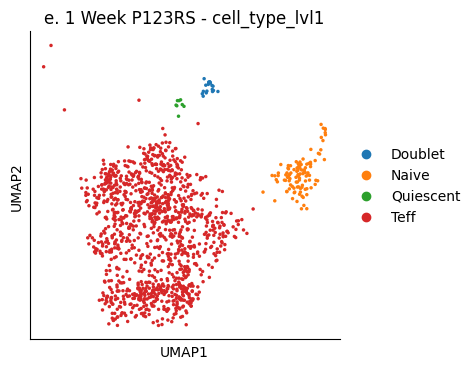

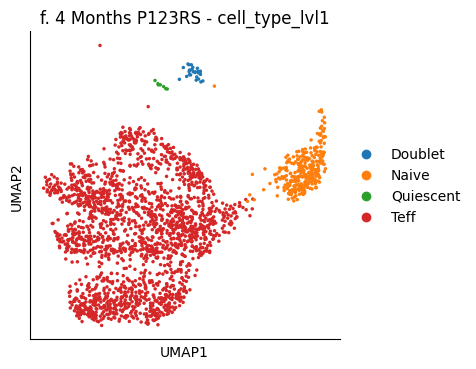

In [37]:
subsample_col = 'subsample'

# Itera sobre cada submuestra y genera un UMAP
for sample in adata_p123.obs[subsample_col].unique():
    adata_sub = adata_p123[adata_p123.obs[subsample_col] == sample]
    
    # Genera el UMAP coloreado por cell_type_lvl1
    sc.pl.umap(
        adata_sub,
        color="cell_type_lvl1",
        legend_loc='right margin',
        size=25,
        title=f"{sample} - cell_type_lvl1"
    )

In [38]:
import pandas as pd
counts = pd.crosstab(adata_p123.obs['cell_type_lvl1'], adata_p123.obs['subsample'], dropna=False)
counts

subsample,d. Pre-Treatment P123RS,e. 1 Week P123RS,f. 4 Months P123RS
cell_type_lvl1,,,
Doublet,22,19,26
Naive,111,107,293
Quiescent,25,8,7
Teff,2196,1187,1933


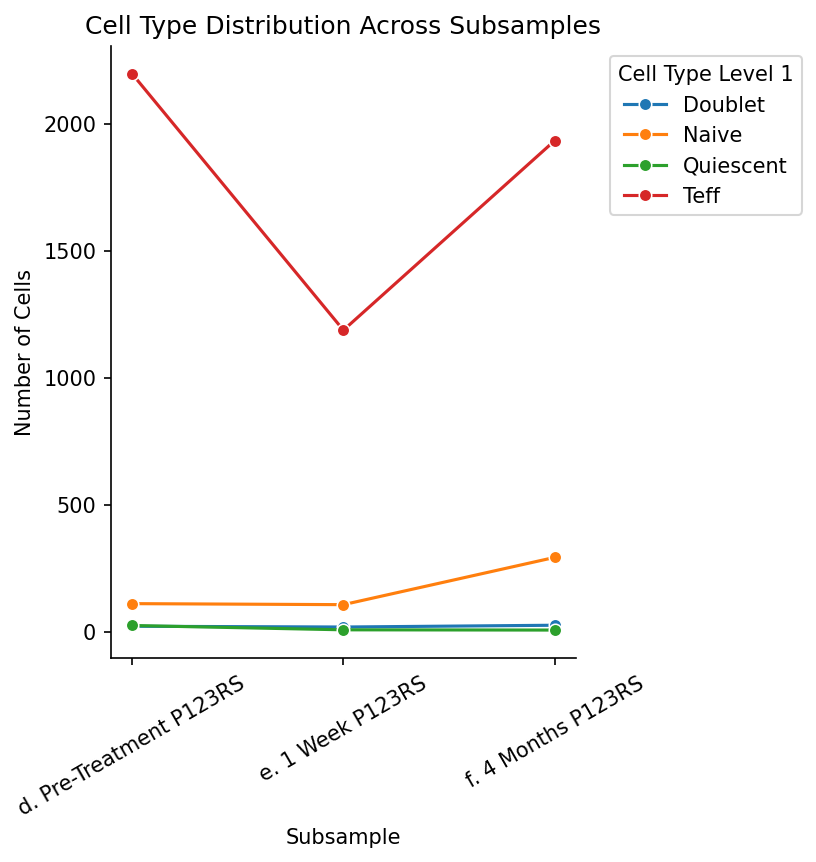

In [39]:
long_counts = counts.reset_index().melt(id_vars='cell_type_lvl1', var_name='subsample', value_name='n_cells')
import matplotlib.pyplot as plt

fig, ax = plt.subplots(figsize=(4, 6), dpi=150)
ax = sns.lineplot(data=long_counts, x='subsample', y='n_cells', hue='cell_type_lvl1', marker='o', errorbar=None, ax=ax)

ax.set_xlabel("Subsample")
ax.set_ylabel("Number of Cells")
ax.tick_params(axis='x', rotation=30, labelsize=10)
ax.set_title("Cell Type Distribution Across Subsamples")
ax.legend(title="Cell Type Level 1", bbox_to_anchor=(1.05, 1), loc='best')


fig.subplots_adjust(bottom=0.2)
fig.savefig("/lustre1/project/stg_00135/Cecilia/Data/5_Trajectory/v4/P123_CD8/p123_CD8_celltype_distribution_across_subsamples.pdf", bbox_inches='tight')

Mean expression of EIF1:
  CD8 T: 2.062
Mean expression of STAT1:
  CD8 T: 0.387
Mean expression of CCR7:
  CD8 T: 0.106
Mean expression of IL7R:
  CD8 T: 0.382
Mean expression of TCF7:
  CD8 T: 0.452
Mean expression of JUN:
  CD8 T: 0.554
Mean expression of NFKBIA:
  CD8 T: 0.656
Mean expression of TNFAIP3:
  CD8 T: 0.544
Mean expression of ZFP36:
  CD8 T: 1.012
Mean expression of CD3G:
  CD8 T: 0.617
Mean expression of IFITM1:
  CD8 T: 1.834
Mean expression of CD74:
  CD8 T: 1.756
    using 'X_pca' with n_pcs = 50
Storing dendrogram info using `.uns['dendrogram_subsample']`


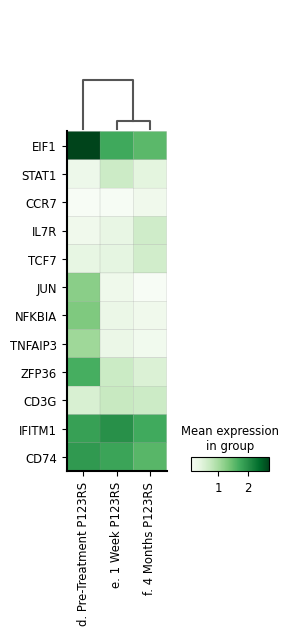

In [40]:
import pandas as pd
import scanpy as sc

genes = ['EIF1', 'STAT1', 'CCR7', 'IL7R', 'TCF7', 'JUN', 'NFKBIA', 'TNFAIP3', 'ZFP36', 'CD3G', 'IFITM1', 'CD74']

# Calculate mean expression per gene per timepoint
mean_expr = {}
for gene in genes:
    means = []
    for tp in sorted(adata_p123.obs['predicted.celltype.l1'].unique()):
        cells_tp = adata_p123.obs.index[adata_p123.obs['predicted.celltype.l1'] == tp]
        expr_vals = adata_p123[cells_tp, gene].X
        if hasattr(expr_vals, "toarray"):
            expr_vals = expr_vals.toarray()
        mean_val = expr_vals.mean()
        means.append((tp, mean_val))
    mean_expr[gene] = means

# Print the mean expression per gene per timepoint
for gene, means in mean_expr.items():
    print(f"Mean expression of {gene}:")
    for tp, mean_val in means:
        print(f"  {tp}: {mean_val:.3f}")

# Now plot matrixplot as you wrote
sc.pl.matrixplot(
    adata_p123,
    var_names=genes,
    groupby="subsample",
    standard_scale="none",    # z-score genes for comparability
    cmap="Greens",
    dendrogram=True,
    swap_axes=True,
    save="Markers_Celltype.pdf"
)


In [41]:
# Extract marker genes as metadata columns
if 'CD69' in adata_p123.var_names:
    idx = adata_p123.var_names.get_loc('CD69')
    if hasattr(adata_p123.X, 'toarray'):  # Sparse matrix
        adata_p123.obs['CD69'] = adata_p123.X[:, idx].toarray().flatten()
    else:  # Dense matrix
        adata_p123.obs['CD69'] = adata_p123.X[:, idx].flatten()
    print("✓ CD69 extracted")

if 'CD25' in adata_p123.var_names:
    idx = adata_p123.var_names.get_loc('CD25')
    if hasattr(adata_p123.X, 'toarray'):
        adata_p123.obs['CD25'] = adata_p123.X[:, idx].toarray().flatten()
    else:
        adata_p123.obs['CD25'] = adata_p123.X[:, idx].flatten()
    print("✓ CD25 extracted")

# HLA-DR might be HLA-DRA, HLA-DRB1, etc.
hla_candidates = [name for name in adata_p123.var_names if 'HLA' in name and 'DR' in name]
if hla_candidates:
    hla_gene = hla_candidates[0]
    idx = adata_p123.var_names.get_loc(hla_gene)
    if hasattr(adata_p123.X, 'toarray'):
        adata_p123.obs['HLA_DR'] = adata_p123.X[:, idx].toarray().flatten()
    else:
        adata_p123.obs['HLA_DR'] = adata_p123.X[:, idx].flatten()
    print(f"✓ HLA-DR extracted (using {hla_gene})")


✓ CD69 extracted
✓ HLA-DR extracted (using HLA-DRA)


COMPREHENSIVE STAT1-GOF CD8 T-CELL ANALYSIS - ALL SIGNATURES

Dataset: 5934 cells

✓ Found 'subsample' column
  Subsamples: [np.str_('d. Pre-Treatment P123RS'), np.str_('e. 1 Week P123RS'), np.str_('f. 4 Months P123RS')]

DEFINING CD8-SPECIFIC GENE SIGNATURES

Total signatures defined: 16
  - STAT1_ISG
  - TCR_activation
  - Proliferation
  - IL1_response
  - Exhaustion
  - Senescence
  - CD8_cytotoxic
  - CD8_Th1_like
  - Glycolysis
  - Lipid_oxidation
  - Central_memory
  - Effector_memory
  - CD8_tissue_resident
  - STAT_inhibitors
  - CD8_NK_like
  - DNA_damage

SCORING GENE SIGNATURES
computing score 'STAT1_ISG_score'
    finished: added
    'STAT1_ISG_score', score of gene set (adata.obs).
    398 total control genes are used. (0:00:00)
  ✓ STAT1_ISG: 10/11 genes
computing score 'TCR_activation_score'
    finished: added
    'TCR_activation_score', score of gene set (adata.obs).
    350 total control genes are used. (0:00:00)
  ✓ TCR_activation: 9/9 genes
computing score 'Prolife

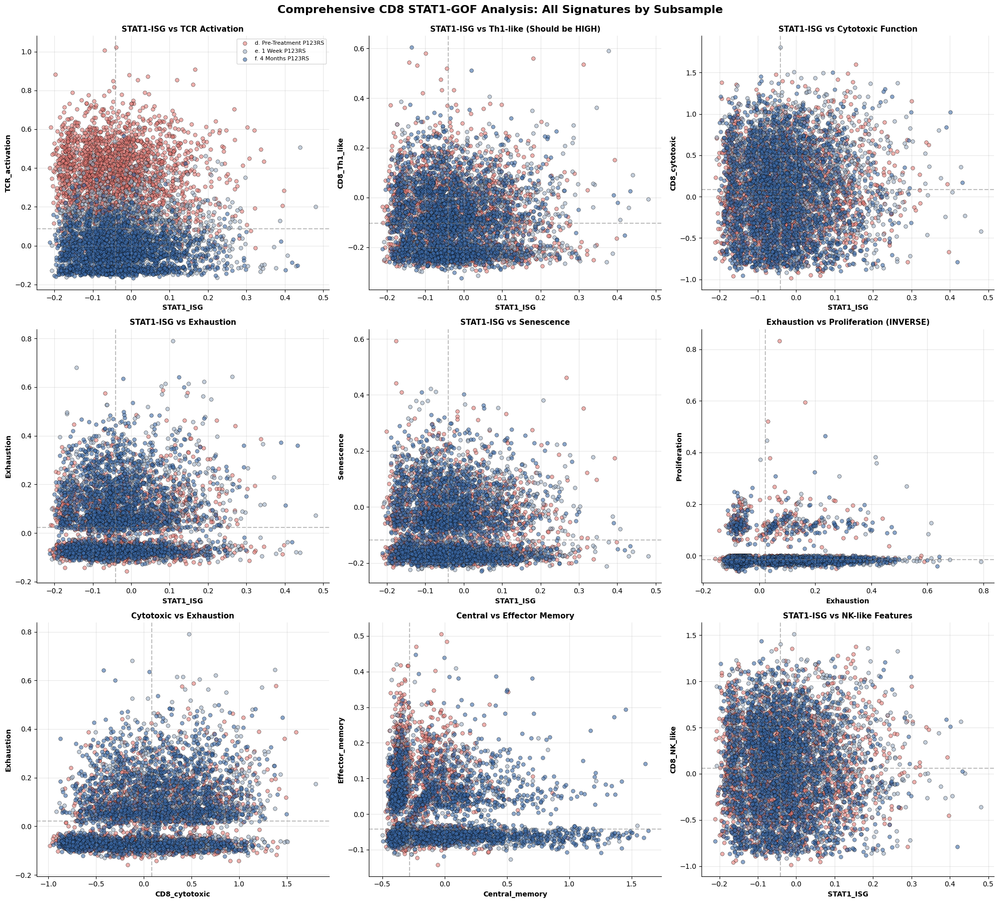


CALCULATING STAT1-ISG/TCR QUADRANT COMPOSITION BY SUBSAMPLE

              Subsample  Q1_count  Q1_percent  Q2_count  Q2_percent  Q3_count  Q3_percent  Q4_count  Q4_percent
d. Pre-Treatment P123RS      1007   42.778250        97    4.120646        77    3.271028      1173   49.830076
       e. 1 Week P123RS       305   23.088569       457   34.595004       320   24.224073       239   18.092354
     f. 4 Months P123RS       110    4.869411       991   43.868969      1025   45.374059       133    5.887561

✓ Quadrant composition saved to 'CD8_STAT1_quadrant_composition.csv'

✓ CD8 STAT1/TCR quadrant bar plot saved


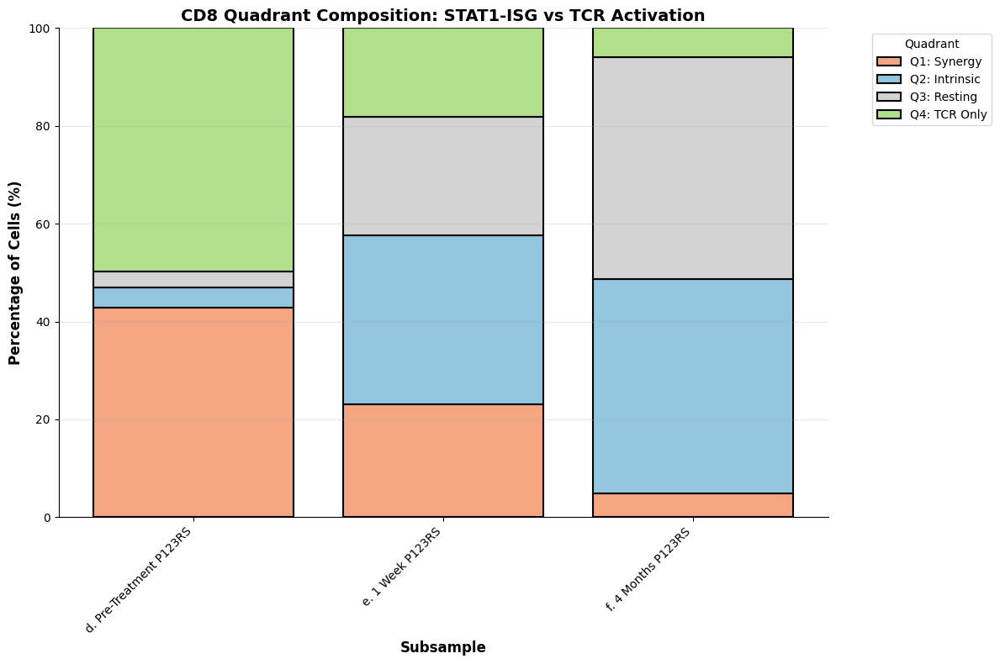


CREATING COMPREHENSIVE HEATMAP (log-scale)

✓ Log-scale heatmap saved as 'STAT1_all_signatures_heatmap_logscale.pdf'
  (Colors in log-scale for better contrast, numbers show original values)


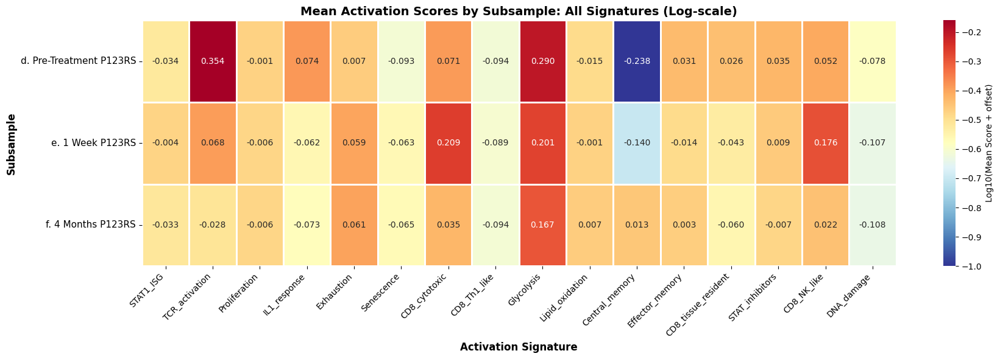


ORIGINAL MEAN SCORES BY SUBSAMPLE

                         STAT1_ISG  TCR_activation  Proliferation  IL1_response  Exhaustion  Senescence  CD8_cytotoxic  CD8_Th1_like  Glycolysis  Lipid_oxidation  Central_memory  Effector_memory  CD8_tissue_resident  STAT_inhibitors  CD8_NK_like  DNA_damage
d. Pre-Treatment P123RS  -0.034422        0.354240      -0.000924      0.074053    0.006928   -0.092658       0.070580     -0.094149    0.290180        -0.014595       -0.238021         0.030727             0.026077         0.034834     0.052488   -0.078385
e. 1 Week P123RS         -0.003662        0.068427      -0.005801     -0.061827    0.059434   -0.063197       0.208736     -0.089126    0.200591        -0.000536       -0.140198        -0.013753            -0.042965         0.008778     0.175722   -0.106729
f. 4 Months P123RS       -0.032666       -0.028074      -0.006277     -0.072847    0.060942   -0.065250       0.035445     -0.093727    0.167423         0.006614        0.013070         0.00

/data/leuven/344/vsc34467/miniconda3/envs/scvelo_env/lib/python3.11/site-packages/pandas/core/arraylike.py:399: RuntimeWarning: invalid value encountered in log2
  result = getattr(ufunc, method)(*inputs, **kwargs)



✓ Treatment response heatmap saved as 'STAT1_treatment_response_heatmap.pdf'
  (Positive values = decrease in activation [improvement])
  (Negative values = increase in activation [worsening])


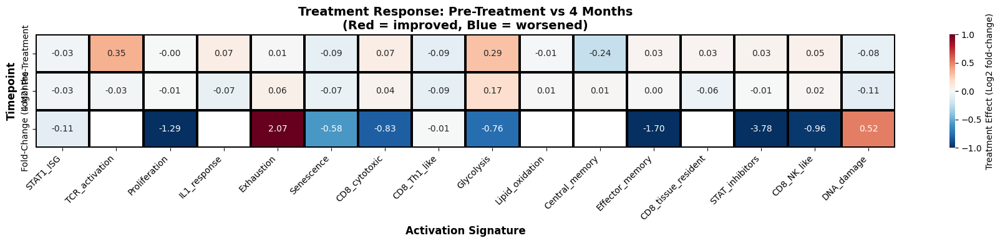


ORIGINAL MEAN SCORES BY SUBSAMPLE

                         STAT1_ISG  TCR_activation  Proliferation  IL1_response  Exhaustion  Senescence  CD8_cytotoxic  CD8_Th1_like  Glycolysis  Lipid_oxidation  Central_memory  Effector_memory  CD8_tissue_resident  STAT_inhibitors  CD8_NK_like  DNA_damage
d. Pre-Treatment P123RS  -0.034422        0.354240      -0.000924      0.074053    0.006928   -0.092658       0.070580     -0.094149    0.290180        -0.014595       -0.238021         0.030727             0.026077         0.034834     0.052488   -0.078385
e. 1 Week P123RS         -0.003662        0.068427      -0.005801     -0.061827    0.059434   -0.063197       0.208736     -0.089126    0.200591        -0.000536       -0.140198        -0.013753            -0.042965         0.008778     0.175722   -0.106729
f. 4 Months P123RS       -0.032666       -0.028074      -0.006277     -0.072847    0.060942   -0.065250       0.035445     -0.093727    0.167423         0.006614        0.013070         0.00

In [42]:
# COMPREHENSIVE STAT1-GOF CD8 T-CELL ANALYSIS WITH ALL SIGNATURES
# CD8-specific modifications: Cytotoxic function, NK-like features, Tissue residency
# WITH CUSTOM COLORS FOR p123RS TIME POINTS
# WITH QUADRANT COMPOSITION ANALYSIS

import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# ============================================================================
# STEP 1: Load and prepare your data
# ============================================================================

# Replace with your actual object name
adata = adata_p123  # YOUR CD8 OBJECT HERE

print("=" * 70)
print("COMPREHENSIVE STAT1-GOF CD8 T-CELL ANALYSIS - ALL SIGNATURES")
print("=" * 70)

print(f"\nDataset: {adata.n_obs} cells")

# Check for subsample column
if 'subsample' not in adata.obs.columns:
    print("\n✗ ERROR: 'subsample' column not found")
    print("Available columns:", adata.obs.columns.tolist())
else:
    print(f"\n✓ Found 'subsample' column")
    subsamples = adata.obs['subsample'].unique()
    print(f"  Subsamples: {subsamples.tolist()}")

# ============================================================================
# STEP 2: Define CD8-SPECIFIC gene signatures
# ============================================================================

print("\n" + "=" * 70)
print("DEFINING CD8-SPECIFIC GENE SIGNATURES")
print("=" * 70)

# Basic activation signatures (same as CD4)
stat1_isg = ['ISG15', 'ISG20', 'IFIT1', 'IFIT2', 'ISG6', 'MX1', 'OAS1', 
             'IRF7', 'IRF9', 'SP140', 'PARP9']
tcr_activation = ['IL2', 'IL2RA', 'TNF', 'NFKBIA', 'JUN', 'JUNB', 'FOS', 
                  'EGR1', 'EGR2']
proliferation = ['PCNA', 'TOP2A', 'BIRC5', 'CDC20', 'MKI67']
il1_response = ['IL1R1', 'NFKB2', 'RELB', 'TNF', 'IL8']

# Exhaustion markers (MORE relevant in CD8)
exhaustion_checkpoint = ['PDCD1', 'LAG3', 'HAVCR2', 'CTLA4', 'TIGIT']

# Senescence markers (same)
senescence_markers = ['CDKN1A', 'CDKN2A', 'CDKN2B', 'TP53', 'KLRG1']

# CD8-SPECIFIC: Cytotoxic function (REPLACES Th17)
cd8_cytotoxic = ['GZMA', 'GZMB', 'GZMH', 'PRF1', 'GNLY', 'FGFBP2', 'NKG7']

# CD8: Th1-like differentiation (same genes, different meaning)
cd8_th1_like = ['IFNG', 'TBX21', 'STAT4', 'IL12RB1', 'IL12RB2']

# Glycolytic metabolism (same)
glycolytic_metabolism = ['SLC2A1', 'LDHA', 'PFKFB3', 'GAPDH', 'ENO1']

# Lipid oxidation metabolism (same)
lipid_oxidation = ['CPT1A', 'CPT2', 'HADHA', 'HADHB', 'ACAA2']

# Lymphoid homing (Central Memory - same)
lymphoid_homing = ['CCR7', 'SELL', 'IL7R']

# Tissue homing (Effector Memory - same)
tissue_homing = ['CCR2', 'CCR5', 'CCR6', 'CXCR3', 'ITGA1', 'ITGAE']

# CD8-SPECIFIC: Tissue residency markers
cd8_tissue_resident = ['ITGA1', 'ITGAE', 'CXCR6', 'RUNX3', 'ZNF683']

# STAT inhibitors (same)
stat_inhibitors = ['PTPN2', 'PTPN22', 'SOCS1', 'SOCS3']

# CD8-SPECIFIC: NK-like features (relevant in STAT1-GOF)
cd8_nk_like = ['NKG7', 'GNLY', 'GZMA', 'GZMB', 'FGFBP2', 'KLRD1']

# DNA damage response (same)
dna_damage = ['ATM', 'TP53', 'GADD45A', 'GADD45B', 'MDM2', 'CDKN1A']

# Combine all signatures
signatures = {
    # Basic (Tier 0)
    'STAT1_ISG': stat1_isg,
    'TCR_activation': tcr_activation,
    'Proliferation': proliferation,
    'IL1_response': il1_response,
    
    # Tier 1 - CD8 ESSENTIAL
    'Exhaustion': exhaustion_checkpoint,
    'Senescence': senescence_markers,
    'CD8_cytotoxic': cd8_cytotoxic,        # NEW - replaces Th17
    'CD8_Th1_like': cd8_th1_like,          # Relabeled for CD8
    
    # Tier 2 - CD8 HIGHLY RECOMMENDED
    'Glycolysis': glycolytic_metabolism,
    'Lipid_oxidation': lipid_oxidation,
    'Central_memory': lymphoid_homing,
    'Effector_memory': tissue_homing,
    'CD8_tissue_resident': cd8_tissue_resident,  # NEW
    'STAT_inhibitors': stat_inhibitors,
    
    # Tier 3 - CD8 NICE TO HAVE
    'CD8_NK_like': cd8_nk_like,            # NEW - NK features
    'DNA_damage': dna_damage,
}

print(f"\nTotal signatures defined: {len(signatures)}")
for name in signatures.keys():
    print(f"  - {name}")

# ============================================================================
# STEP 3: Validate and score all signatures
# ============================================================================

print("\n" + "=" * 70)
print("SCORING GENE SIGNATURES")
print("=" * 70)

def validate_and_filter_genes(adata, gene_list):
    return [g for g in gene_list if g in adata.var_names]

scored_signatures = []

for sig_name, gene_list in signatures.items():
    score_name = f'{sig_name}_score'
    
    if score_name not in adata.obs.columns:
        valid_genes = validate_and_filter_genes(adata, gene_list)
        if len(valid_genes) > 0:
            sc.tl.score_genes(adata, valid_genes, score_name=score_name)
            print(f"  ✓ {sig_name}: {len(valid_genes)}/{len(gene_list)} genes")
            scored_signatures.append(sig_name)
        else:
            print(f"  ✗ {sig_name}: NO VALID GENES - skipped")
    else:
        print(f"  ✓ {sig_name}: Already scored")
        scored_signatures.append(sig_name)

print(f"\nSuccessfully scored: {len(scored_signatures)} signatures")

# ============================================================================
# STEP 4: Setup custom colors
# ============================================================================

# Get subsamples
subsamples = sorted(adata.obs['subsample'].unique())

# Custom colors for specific subsamples (YOUR COLORS!)
custom_colors = {
    "d. Pre-Treatment P123RS": "#e47c77",
    "e. 1 Week P123RS": "#9caec4",
    "f. 4 Months P123RS": "#3d6ba9"
}

# Create color dictionary - use custom colors if available, fallback to tab10
colors_fallback = plt.cm.tab10(np.linspace(0, 1, len(subsamples)))
color_dict = {}
for idx, sub in enumerate(subsamples):
    if sub in custom_colors:
        color_dict[sub] = custom_colors[sub]
    else:
        color_dict[sub] = colors_fallback[idx]

print("\n" + "=" * 70)
print("COLOR MAPPING")
print("=" * 70)
for sub, color in color_dict.items():
    print(f"  {sub}: {color}")

# ============================================================================
# STEP 5: Create comprehensive 3x3 plot grid (CD8-SPECIFIC)
# ============================================================================

print("\n" + "=" * 70)
print("CREATING CD8-SPECIFIC COMPREHENSIVE PLOT GRID (3x3)")
print("=" * 70)

fig, axes = plt.subplots(3, 3, figsize=(20, 18))
axes = axes.flatten()

# Define CD8-specific plot combinations
plot_combinations = [
    ('STAT1_ISG_score', 'TCR_activation_score', 'STAT1-ISG vs TCR Activation'),
    ('STAT1_ISG_score', 'CD8_Th1_like_score', 'STAT1-ISG vs Th1-like (Should be HIGH)'),
    ('STAT1_ISG_score', 'CD8_cytotoxic_score', 'STAT1-ISG vs Cytotoxic Function'),
    ('STAT1_ISG_score', 'Exhaustion_score', 'STAT1-ISG vs Exhaustion'),
    ('STAT1_ISG_score', 'Senescence_score', 'STAT1-ISG vs Senescence'),
    ('Exhaustion_score', 'Proliferation_score', 'Exhaustion vs Proliferation (INVERSE)'),
    ('CD8_cytotoxic_score', 'Exhaustion_score', 'Cytotoxic vs Exhaustion'),
    ('Central_memory_score', 'Effector_memory_score', 'Central vs Effector Memory'),
    ('STAT1_ISG_score', 'CD8_NK_like_score', 'STAT1-ISG vs NK-like Features'),
]

for idx, (x_score, y_score, title) in enumerate(plot_combinations):
    ax = axes[idx]
    
    # Check if both scores exist
    if x_score in adata.obs.columns and y_score in adata.obs.columns:
        for subsample in subsamples:
            adata_sub = adata[adata.obs['subsample'] == subsample]
            ax.scatter(adata_sub.obs[x_score],
                       adata_sub.obs[y_score],
                       label=subsample, color=color_dict[subsample],
                       alpha=0.6, s=30, edgecolors='black', linewidth=0.5)
        
        # Add median lines
        x_med = adata.obs[x_score].median()
        y_med = adata.obs[y_score].median()
        ax.axhline(y_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        ax.axvline(x_med, color='gray', linestyle='--', alpha=0.5, linewidth=1.5)
        
        ax.set_xlabel(x_score.replace('_score', ''), fontsize=10, fontweight='bold')
        ax.set_ylabel(y_score.replace('_score', ''), fontsize=10, fontweight='bold')
        ax.set_title(title, fontsize=11, fontweight='bold')
        ax.grid(True, alpha=0.3)
        if idx == 0:
            ax.legend(fontsize=8, loc='best')
    else:
        ax.text(0.5, 0.5, f'Missing:\n{x_score}\nor\n{y_score}', 
                ha='center', va='center', transform=ax.transAxes)

plt.suptitle('Comprehensive CD8 STAT1-GOF Analysis: All Signatures by Subsample', 
             fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig('./P123_CD8/CD8_STAT1_comprehensive_all_signatures.pdf', dpi=300, bbox_inches='tight')
print("\n✓ CD8 comprehensive plot saved as 'CD8_STAT1_comprehensive_all_signatures.pdf'")
plt.show()

# ============================================================================
# STEP 6: STAT1-ISG vs TCR Quadrant Composition Analysis
# ============================================================================

print("\n" + "=" * 70)
print("CALCULATING STAT1-ISG/TCR QUADRANT COMPOSITION BY SUBSAMPLE")
print("=" * 70)

if 'STAT1_ISG_score' in adata.obs.columns and 'TCR_activation_score' in adata.obs.columns:
    
    stat1_med = adata.obs['STAT1_ISG_score'].median()
    tcr_med = adata.obs['TCR_activation_score'].median()
    
    def assign_quadrant(row):
        if row['STAT1_ISG_score'] > stat1_med and row['TCR_activation_score'] > tcr_med:
            return 'Q1: STAT1+TCR+ (Synergy)'
        elif row['STAT1_ISG_score'] > stat1_med and row['TCR_activation_score'] <= tcr_med:
            return 'Q2: STAT1+TCR- (Intrinsic)'
        elif row['STAT1_ISG_score'] <= stat1_med and row['TCR_activation_score'] <= tcr_med:
            return 'Q3: STAT1-TCR- (Resting)'
        else:
            return 'Q4: STAT1-TCR+ (TCR Only)'
    
    adata.obs['quadrant'] = adata.obs.apply(assign_quadrant, axis=1)
    
    quadrant_composition = []
    
    for subsample in subsamples:
        adata_sub = adata[adata.obs['subsample'] == subsample]
        total = len(adata_sub)
        
        q1 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q1: STAT1+TCR+ (Synergy)'])
        q2 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q2: STAT1+TCR- (Intrinsic)'])
        q3 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q3: STAT1-TCR- (Resting)'])
        q4 = len(adata_sub[adata_sub.obs['quadrant'] == 'Q4: STAT1-TCR+ (TCR Only)'])
        
        quadrant_composition.append({
            'Subsample': subsample,
            'Q1_count': q1,
            'Q1_percent': 100 * q1 / total,
            'Q2_count': q2,
            'Q2_percent': 100 * q2 / total,
            'Q3_count': q3,
            'Q3_percent': 100 * q3 / total,
            'Q4_count': q4,
            'Q4_percent': 100 * q4 / total
        })
    
    quadrant_df = pd.DataFrame(quadrant_composition)
    print("\n" + quadrant_df.to_string(index=False))
    
    quadrant_df.to_csv('CD8_STAT1_quadrant_composition.csv', index=False)
    print("\n✓ Quadrant composition saved to 'CD8_STAT1_quadrant_composition.csv'")
    
    # Create stacked bar plot
    fig, ax = plt.subplots(figsize=(12, 8))
    
    quad_data = quadrant_df[['Subsample', 'Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']]
    
    quad_colors = {
        'Q1_percent': '#f4a582',
        'Q2_percent': '#92c5de',
        'Q3_percent': '#d3d3d3',
        'Q4_percent': '#b2df8a'
    }
    
    bottom = np.zeros(len(subsamples))
    
    for quad in ['Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']:
        quad_label = quad.replace('_percent', '').replace('Q1', 'Q1: Synergy').replace('Q2', 'Q2: Intrinsic').replace('Q3', 'Q3: Resting').replace('Q4', 'Q4: TCR Only')
        ax.bar(range(len(subsamples)), quad_data[quad], 
               bottom=bottom, label=quad_label, color=quad_colors[quad],
               edgecolor='black', linewidth=1.5)
        bottom += quad_data[quad].values
    
    ax.set_xticks(range(len(subsamples)))
    ax.set_xticklabels(subsamples, rotation=45, ha='right')
    ax.set_ylabel('Percentage of Cells (%)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Subsample', fontsize=12, fontweight='bold')
    ax.set_title('CD8 Quadrant Composition: STAT1-ISG vs TCR Activation', fontsize=14, fontweight='bold')
    ax.legend(title='Quadrant', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=10)
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3, axis='y')
    
    plt.tight_layout()
    plt.savefig('./P123_CD8/CD8_STAT1_quadrant_composition_barplot.pdf', dpi=300, bbox_inches='tight')
    print("\n✓ CD8 STAT1/TCR quadrant bar plot saved")
    plt.show()

# IMPROVED HEATMAP WITH LOG-SCALE TRANSFORMATION
# This keeps the original style but uses log-scale for better visualization
# Replace the heatmap section in your scripts with this

# ============================================================================
# STEP 7: Comprehensive heatmap with LOG-SCALE
# ============================================================================

print("\n" + "=" * 70)
print("CREATING COMPREHENSIVE HEATMAP (log-scale)")
print("=" * 70)

score_cols = [col for col in adata.obs.columns if '_score' in col]
heatmap_data = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    row = {score: adata_sub.obs[score].mean() for score in score_cols}
    heatmap_data.append(row)

heatmap_df = pd.DataFrame(heatmap_data, index=subsamples)
heatmap_df.columns = [col.replace('_score', '') for col in heatmap_df.columns]

# Apply log transformation (with offset to handle negative values)
# Add small offset to ensure all values are positive before log
offset = abs(heatmap_df.min().min()) + 0.1  # Make sure all values positive
heatmap_df_log = np.log10(heatmap_df + offset)

# Create figure
fig, ax = plt.subplots(figsize=(18, 6))

# Create heatmap with log-transformed values, but show original values in annotations
sns.heatmap(heatmap_df_log, annot=heatmap_df, fmt='.3f', 
            cmap='RdYlBu_r', 
            cbar_kws={'label': 'Log10(Mean Score + offset)'}, 
            ax=ax, linewidths=1, center=None)

ax.set_title('Mean Activation Scores by Subsample: All Signatures (Log-scale)', 
             fontsize=14, fontweight='bold')
ax.set_ylabel('Subsample', fontsize=12, fontweight='bold')
ax.set_xlabel('Activation Signature', fontsize=12, fontweight='bold')

# Rotate labels for readability
ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)
ax.set_yticklabels(ax.get_yticklabels(), rotation=0, fontsize=11)

plt.tight_layout()
plt.savefig('./P123_CD8/STAT1_all_signatures_heatmap_logscale.pdf', dpi=300, bbox_inches='tight')
print("\n✓ Log-scale heatmap saved as 'STAT1_all_signatures_heatmap_logscale.pdf'")
print("  (Colors in log-scale for better contrast, numbers show original values)")
plt.show()

# Also print the original values for reference
print("\n" + "=" * 70)
print("ORIGINAL MEAN SCORES BY SUBSAMPLE")
print("=" * 70)
print("\n" + heatmap_df.to_string())


# ALTERNATIVE: Create a second heatmap showing CHANGE from Pre-Treatment to 4 Months
print("\n" + "=" * 70)
print("CREATING TREATMENT RESPONSE HEATMAP")
print("=" * 70)

# Find Pre-Treatment and 4 Months rows
pretreat_row = None
months4_row = None

for idx, subsample in enumerate(subsamples):
    if 'Pre-Treatment' in subsample or 'pre' in subsample.lower():
        pretreat_row = idx
    if '4 Months' in subsample or '4month' in subsample.lower():
        months4_row = idx

if pretreat_row is not None and months4_row is not None:
    # Calculate fold-change (log2)
    pretreat_values = heatmap_df.iloc[pretreat_row]
    months4_values = heatmap_df.iloc[months4_row]
    
    # Avoid division by zero
    fold_change = np.log2((months4_values + 0.01) / (pretreat_values + 0.01))
    
    # Create dataframe for visualization
    response_df = pd.DataFrame({
        'Pre-Treatment': pretreat_values,
        '4 Months': months4_values,
        'Fold-Change (Log2)': fold_change
    }).T
    
    fig, ax = plt.subplots(figsize=(18, 4))
    
    sns.heatmap(response_df, annot=True, fmt='.2f', 
                cmap='RdBu_r', center=0, 
                cbar_kws={'label': 'Treatment Effect (Log2 fold-change)'}, 
                ax=ax, linewidths=1.5, linecolor='black',vmin=-1, vmax=1)
    
    ax.set_title('Treatment Response: Pre-Treatment vs 4 Months\n(Red = improved, Blue = worsened)', 
                 fontsize=14, fontweight='bold')
    ax.set_ylabel('Timepoint', fontsize=12, fontweight='bold')
    ax.set_xlabel('Activation Signature', fontsize=12, fontweight='bold')
    
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    
    plt.tight_layout()
    plt.savefig('./P123_CD8/STAT1_treatment_response_heatmap.pdf', dpi=300, bbox_inches='tight')
    print("\n✓ Treatment response heatmap saved as 'STAT1_treatment_response_heatmap.pdf'")
    print("  (Positive values = decrease in activation [improvement])")
    print("  (Negative values = increase in activation [worsening])")
    plt.show()
else:
    print("\n⚠ Could not identify Pre-Treatment and 4 Months subsamples")
    print("   Make sure subsample names contain 'Pre-Treatment' and '4 Months'")

# Also print the original values for reference
print("\n" + "=" * 70)
print("ORIGINAL MEAN SCORES BY SUBSAMPLE")
print("=" * 70)
print("\n" + heatmap_df.to_string())
print("\n✓ Original values saved in heatmap_df")


# ============================================================================
# STEP 8: Summary statistics table
# ============================================================================

print("\n" + "=" * 70)
print("CD8 COMPREHENSIVE STATISTICS BY SUBSAMPLE")
print("=" * 70)

summary_stats = []

for subsample in subsamples:
    adata_sub = adata[adata.obs['subsample'] == subsample]
    
    row = {'Subsample': subsample, 'N_cells': len(adata_sub)}
    
    for sig_name in scored_signatures:
        score_name = f'{sig_name}_score'
        if score_name in adata_sub.obs.columns:
            row[f'{sig_name}_mean'] = adata_sub.obs[score_name].mean()
            row[f'{sig_name}_std'] = adata_sub.obs[score_name].std()
    
    summary_stats.append(row)

summary_df = pd.DataFrame(summary_stats)
print("\n" + summary_df.to_string(index=False))

summary_df.to_csv('CD8_STAT1_all_signatures_statistics.csv', index=False)
print("\n✓ CD8 statistics saved to 'CD8_STAT1_all_signatures_statistics.csv'")

# ============================================================================
# STEP 9: Final Summary
# ============================================================================

print("\n" + "=" * 70)
print("CD8 ANALYSIS COMPLETE - ALL FILES GENERATED")
print("=" * 70)

print(f"""
FILES GENERATED:
  1. CD8_STAT1_comprehensive_all_signatures.pdf (3x3 grid with YOUR COLORS)
  2. CD8_STAT1_quadrant_composition_barplot.pdf (STAT1/TCR quadrants)
  3. CD8_STAT1_quadrant_composition.csv (STAT1/TCR statistics)
  4. CD8_STAT1_all_signatures_heatmap.pdf (score comparison)
  5. CD8_STAT1_all_signatures_statistics.csv (detailed statistics)

Total signatures scored: {len(scored_signatures)}

CD8-SPECIFIC SIGNATURES:
  ✓ CD8_cytotoxic (GZMA, GZMB, PRF1) - replaces Th17
  ✓ CD8_NK_like (NKG7, KLRD1) - abnormal in STAT1-GOF
  ✓ CD8_tissue_resident (ITGA1, ITGAE, CXCR6) - tissue homing

COLOR SCHEME (subsamples):
  - Pre-Treatment p123RS: #e47c77 (coral)
  - 1 Week p123RS: #9caec4 (light blue)
  - 4 Months p123RS: #3d6ba9 (dark blue)

KEY CD8 INTERPRETATIONS:
  - High cytotoxic + high exhaustion = impaired killing despite granules
  - NK-like features = STAT1-driven aberrant differentiation
  - Q2 percentage = intrinsic STAT1 contribution (same as CD4)
  - Exhaustion even MORE relevant in CD8 than CD4
""")

print("\n" + "=" * 70)
print("Ready for CD8 analysis! 🎓")
print("=" * 70)



CALCULATING CENTRAL VS EFFECTOR MEMORY QUADRANT COMPOSITION

Thresholds:
  Central Memory (CCR7+) median: -0.279
  Effector Memory (tissue-homing) median: -0.043

MEMORY QUADRANT COMPOSITION

              Subsample  Q1_count  Q1_percent  Q2_count  Q2_percent  Q3_count  Q3_percent  Q4_count  Q4_percent
d. Pre-Treatment P123RS       553   23.491929       360   15.293118       618   26.253186       823   34.961767
       e. 1 Week P123RS       258   19.530659       373   28.236185       429   32.475397       261   19.757759
     f. 4 Months P123RS       678   30.013280       745   32.979194       442   19.566180       394   17.441346

✓ Memory quadrant composition saved to 'STAT1_memory_quadrant_composition.csv'

CREATING MEMORY QUADRANT COMPOSITION BAR PLOT

✓ Memory quadrant bar plot saved as 'STAT1_memory_quadrant_barplot.pdf'


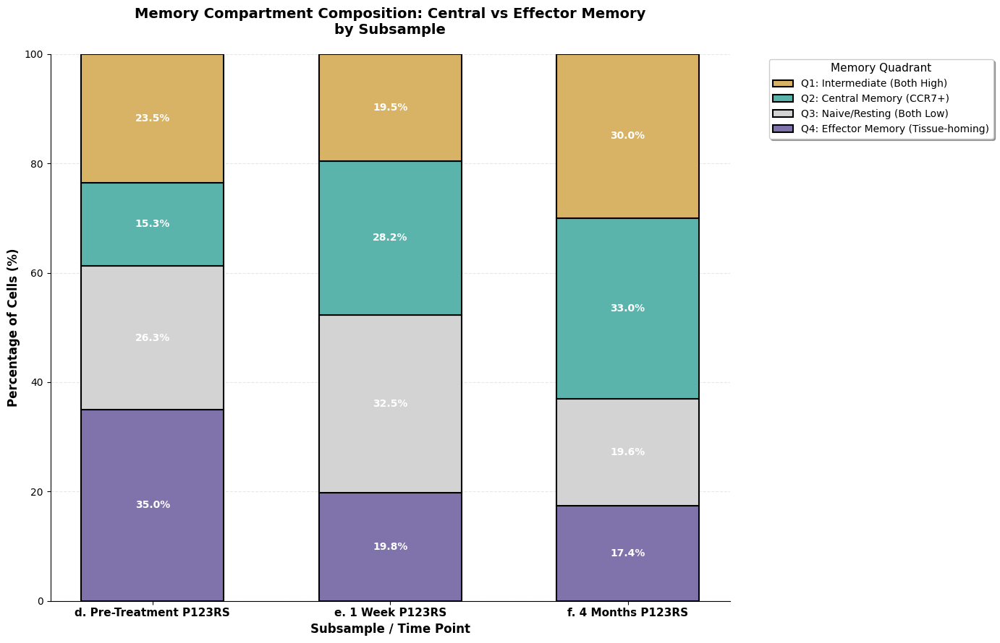


VERIFYING PERCENTAGES
d. Pre-Treatment P123RS: 100.0% (should be 100.0%)
e. 1 Week P123RS: 100.0% (should be 100.0%)
f. 4 Months P123RS: 100.0% (should be 100.0%)

MEMORY QUADRANT INTERPRETATION

CENTRAL VS EFFECTOR MEMORY QUADRANTS:

Q1 (Tan - Central+Effector+): Intermediate/Transitional Memory
  - CCR7+ AND tissue homing markers BOTH HIGH
  - Rare transitional state
  - Expected: LOW in all subsamples

Q2 (Teal - Central+Effector-): Central Memory (Tcm)
  - CCR7+ HIGH (lymphoid homing)
  - Tissue homing markers LOW
  - Recirculates through secondary lymphoid organs
  - Expected: May INCREASE with treatment (restoration)

Q3 (Gray - Central-Effector-): Naive/Resting State
  - Both markers LOW
  - Circulating naive T-cells
  - Expected: Moderate baseline

Q4 (Purple - Central-Effector+): Effector Memory (Tem) ← KEY STAT1-GOF
  - CCR7- (NO lymphoid homing)
  - Tissue homing markers HIGH (CCR2, CCR5, CXCR3, ITGA1, ITGAE)
  - Localizes to peripheral tissues
  - Expected: HIGHER in Pre-T

In [43]:
# CENTRAL VS EFFECTOR MEMORY QUADRANT BAR PLOT - CORRECTED
# Creates a properly stacked bar chart showing memory compartment composition
# All quadrants add up to 100%

# ============================================================================
# MEMORY QUADRANT COMPOSITION ANALYSIS AND VISUALIZATION
# ============================================================================

print("\n" + "=" * 70)
print("CALCULATING CENTRAL VS EFFECTOR MEMORY QUADRANT COMPOSITION")
print("=" * 70)

if 'Central_memory_score' in adata_p123.obs.columns and 'Effector_memory_score' in adata_p123.obs.columns:
    
    # Use global medians for threshold
    central_med = adata_p123.obs['Central_memory_score'].median()
    effector_med = adata_p123.obs['Effector_memory_score'].median()
    
    print(f"\nThresholds:")
    print(f"  Central Memory (CCR7+) median: {central_med:.3f}")
    print(f"  Effector Memory (tissue-homing) median: {effector_med:.3f}")
    
    # Assign memory quadrant to each cell
    def assign_memory_quadrant(row):
        if row['Central_memory_score'] > central_med and row['Effector_memory_score'] > effector_med:
            return 'Q1: Central+Effector+ (Intermediate)'
        elif row['Central_memory_score'] > central_med and row['Effector_memory_score'] <= effector_med:
            return 'Q2: Central+Effector- (Central Memory)'
        elif row['Central_memory_score'] <= central_med and row['Effector_memory_score'] <= effector_med:
            return 'Q3: Central-Effector- (Naive/Resting)'
        else:
            return 'Q4: Central-Effector+ (Effector Memory)'
    
    adata_p123.obs['memory_quadrant'] = adata_p123.obs.apply(assign_memory_quadrant, axis=1)
    
    # Calculate memory composition by subsample
    memory_composition = []
    
    for subsample in subsamples:
        adata_sub = adata_p123[adata_p123.obs['subsample'] == subsample]
        total = len(adata_sub)
        
        # Count cells in each memory quadrant
        q1 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q1: Central+Effector+ (Intermediate)'])
        q2 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q2: Central+Effector- (Central Memory)'])
        q3 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q3: Central-Effector- (Naive/Resting)'])
        q4 = len(adata_sub[adata_sub.obs['memory_quadrant'] == 'Q4: Central-Effector+ (Effector Memory)'])
        
        memory_composition.append({
            'Subsample': subsample,
            'Q1_count': q1,
            'Q1_percent': 100 * q1 / total,
            'Q2_count': q2,
            'Q2_percent': 100 * q2 / total,
            'Q3_count': q3,
            'Q3_percent': 100 * q3 / total,
            'Q4_count': q4,
            'Q4_percent': 100 * q4 / total
        })
    
    memory_df = pd.DataFrame(memory_composition)
    print("\n" + "=" * 70)
    print("MEMORY QUADRANT COMPOSITION")
    print("=" * 70)
    print("\n" + memory_df.to_string(index=False))
    
    # Save to CSV
    memory_df.to_csv('STAT1_memory_quadrant_composition.csv', index=False)
    print("\n✓ Memory quadrant composition saved to 'STAT1_memory_quadrant_composition.csv'")
    
    # ========================================================================
    # Create MEMORY quadrant stacked bar plot - CORRECTED VERSION
    # ========================================================================
    
    print("\n" + "=" * 70)
    print("CREATING MEMORY QUADRANT COMPOSITION BAR PLOT")
    print("=" * 70)
    
    fig, ax = plt.subplots(figsize=(14, 9))
    
    # Prepare data for plotting
    memory_data = memory_df[['Subsample', 'Q1_percent', 'Q2_percent', 'Q3_percent', 'Q4_percent']]
    
    # Define memory quadrant colors (distinct from subsample colors)
    memory_colors = {
        'Q1_percent': '#d8b365',  # tan - Intermediate
        'Q2_percent': '#5ab4ac',  # teal - Central Memory
        'Q3_percent': '#d3d3d3',  # light gray - Naive/Resting
        'Q4_percent': '#8073ac'   # purple - Effector Memory (KEY in STAT1-GOF)
    }
    
    # Create x positions for bars
    x_pos = np.arange(len(subsamples))
    width = 0.6
    
    # Create stacked bar - CORRECTED: Initialize bottom array
    bottom = np.zeros(len(subsamples))
    
    # Plot in order from bottom to top (Q4 -> Q3 -> Q2 -> Q1)
    # This ensures proper stacking and legend order
    quad_order = ['Q4_percent', 'Q3_percent', 'Q2_percent', 'Q1_percent']
    quad_labels = [
        'Q4: Effector Memory (Tissue-homing)',
        'Q3: Naive/Resting (Both Low)',
        'Q2: Central Memory (CCR7+)',
        'Q1: Intermediate (Both High)'
    ]
    
    for quad, label in zip(quad_order, quad_labels):
        values = memory_data[quad].values
        # CORRECTED: Added bottom parameter for proper stacking
        bars = ax.bar(x_pos, values, width, label=label, 
                      color=memory_colors[quad],
                      edgecolor='black', linewidth=1.5,
                      bottom=bottom)
        
        # Add percentage labels on bars
        for i, (bar, val) in enumerate(zip(bars, values)):
            if val > 3:  # Only show label if segment is large enough
                # Calculate center of this segment
                y_pos = bottom[i] + val/2
                ax.text(bar.get_x() + bar.get_width()/2., y_pos,
                       f'{val:.1f}%',
                       ha='center', va='center', fontsize=10, fontweight='bold',
                       color='white' if val > 10 else 'black')
        
        # CORRECTED: Update bottom for next stack layer
        bottom += values
    
    # Customize plot
    ax.set_xticks(x_pos)
    ax.set_xticklabels(subsamples, fontsize=11, fontweight='bold')
    ax.set_ylabel('Percentage of Cells (%)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Subsample / Time Point', fontsize=12, fontweight='bold')
    ax.set_title('Memory Compartment Composition: Central vs Effector Memory\nby Subsample', 
                 fontsize=14, fontweight='bold', pad=20)
    
    # Reverse legend order to match visual bottom-to-top
    handles, labels = ax.get_legend_handles_labels()
    ax.legend(handles[::-1], labels[::-1], 
             title='Memory Quadrant', bbox_to_anchor=(1.05, 1), loc='upper left', 
             fontsize=10, title_fontsize=11, frameon=True, fancybox=True, shadow=True)
    
    ax.set_ylim(0, 100)
    ax.grid(True, alpha=0.3, axis='y', linestyle='--')
    ax.set_axisbelow(True)
    
    plt.tight_layout()
    plt.savefig('./P123_CD8/STAT1_memory_quadrant_barplot.pdf', dpi=300, bbox_inches='tight')
    print("\n✓ Memory quadrant bar plot saved as 'STAT1_memory_quadrant_barplot.pdf'")
    plt.show()
    
    # ========================================================================
    # Verify totals add up to 100%
    # ========================================================================
    
    print("\n" + "=" * 70)
    print("VERIFYING PERCENTAGES")
    print("=" * 70)
    
    for idx, subsample in enumerate(subsamples):
        total = (memory_df.iloc[idx]['Q1_percent'] + 
                memory_df.iloc[idx]['Q2_percent'] + 
                memory_df.iloc[idx]['Q3_percent'] + 
                memory_df.iloc[idx]['Q4_percent'])
        print(f"{subsample}: {total:.1f}% (should be 100.0%)")
    
    # ========================================================================
    # Print interpretation
    # ========================================================================
    
    print("\n" + "=" * 70)
    print("MEMORY QUADRANT INTERPRETATION")
    print("=" * 70)
    
    interpretation = """
CENTRAL VS EFFECTOR MEMORY QUADRANTS:

Q1 (Tan - Central+Effector+): Intermediate/Transitional Memory
  - CCR7+ AND tissue homing markers BOTH HIGH
  - Rare transitional state
  - Expected: LOW in all subsamples

Q2 (Teal - Central+Effector-): Central Memory (Tcm)
  - CCR7+ HIGH (lymphoid homing)
  - Tissue homing markers LOW
  - Recirculates through secondary lymphoid organs
  - Expected: May INCREASE with treatment (restoration)

Q3 (Gray - Central-Effector-): Naive/Resting State
  - Both markers LOW
  - Circulating naive T-cells
  - Expected: Moderate baseline

Q4 (Purple - Central-Effector+): Effector Memory (Tem) ← KEY STAT1-GOF
  - CCR7- (NO lymphoid homing)
  - Tissue homing markers HIGH (CCR2, CCR5, CXCR3, ITGA1, ITGAE)
  - Localizes to peripheral tissues
  - Expected: HIGHER in Pre-Treatment (STAT1-GOF hallmark!)
  - Expected: DECREASE by 4 Months (rebalancing)

YOUR DATA INTERPRETATION:
Looking at your plot:
  - Pre-Treatment: HIGH Q4 (~38.8%) = Effector memory expansion (STAT1-GOF)
  - 1 Week: Shift to Q3 (resting) - early treatment response
  - 4 Months: HIGH Q2 (~13%) + reduced Q4 = Restoration of central memory

This shows STAT1 drives pathogenic Tem expansion that reverses with treatment!
"""
    
    print(interpretation)

else:
    print("\n⚠ Missing Central_memory_score or Effector_memory_score")
    print("These should have been calculated in the main signature scoring")
    print("Check that 'Central_memory' and 'Effector_memory' signatures were scored")

print("\n" + "=" * 70)
print("MEMORY QUADRANT ANALYSIS COMPLETE")
print("=" * 70)


# Code for Palantir

In [44]:
pca_embedding = pd.DataFrame(adata_p123.obsm["X_pca"], index=adata_p123.obs_names)
pca_embedding.shape

(5934, 50)

In [45]:
"""adata_p123 = adata_p123[:, adata_p123.var.highly_variable]

# Escalado y PCA
sc.pp.scale(adata_p123)


# PCA queda guardado en:
pca_embedding = pd.DataFrame(adata_p123.obsm["X_pca"], index=adata_p123.obs_names)
pca_embedding.shape"""

'adata_p123 = adata_p123[:, adata_p123.var.highly_variable]\n\n# Escalado y PCA\nsc.pp.scale(adata_p123)\n\n\n# PCA queda guardado en:\npca_embedding = pd.DataFrame(adata_p123.obsm["X_pca"], index=adata_p123.obs_names)\npca_embedding.shape'

In [46]:
"""# diffusion map 
dm_res = palantir.utils.run_diffusion_maps(pca_embedding, n_components=5)

#Select only naïve CD4+ T cells 
cells_naive_pre = adata_p123.obs[
    (adata_p123.obs['predicted.celltype.l1'] == 'CD4 T') 
].index

#  naive markers
naive_markers = ['SELL', 'CCR7', 'IL7R', 'LEF1', "TCF7", "BCL2"]  


# Ensure only the available genes are used
available_markers = [g for g in naive_markers if g in adata_p123.var_names]
if not available_markers:
    raise ValueError("None of the specified naïve markers are present in adata_p123.")

# Extract expression matrix for those genes
naive_expr = adata_p123[cells_naive_pre, available_markers].X

# If the matrix is sparse, convert to dense
if not isinstance(naive_expr, np.ndarray):
    naive_expr = naive_expr.toarray()

# Compute mean expression of the marker genes per cell
mean_naive_expr = np.mean(naive_expr, axis=1)

# Identify the single most naïve cell
root_cell = cells_naive_pre[np.argmax(mean_naive_expr)]
print(f"Selected root cell: {root_cell}")

#  Run Palantir pseudotime analysis
ms_data = palantir.utils.determine_multiscale_space(dm_res)
palantir_res = palantir.core.run_palantir(ms_data, root_cell)

# Save pseudotime results
adata_p123.obs['pseudotime1'] = palantir_res.pseudotime.values"""


'# diffusion map \ndm_res = palantir.utils.run_diffusion_maps(pca_embedding, n_components=5)\n\n#Select only naïve CD4+ T cells \ncells_naive_pre = adata_p123.obs[\n    (adata_p123.obs[\'predicted.celltype.l1\'] == \'CD4 T\') \n].index\n\n#  naive markers\nnaive_markers = [\'SELL\', \'CCR7\', \'IL7R\', \'LEF1\', "TCF7", "BCL2"]  \n\n\n# Ensure only the available genes are used\navailable_markers = [g for g in naive_markers if g in adata_p123.var_names]\nif not available_markers:\n    raise ValueError("None of the specified naïve markers are present in adata_p123.")\n\n# Extract expression matrix for those genes\nnaive_expr = adata_p123[cells_naive_pre, available_markers].X\n\n# If the matrix is sparse, convert to dense\nif not isinstance(naive_expr, np.ndarray):\n    naive_expr = naive_expr.toarray()\n\n# Compute mean expression of the marker genes per cell\nmean_naive_expr = np.mean(naive_expr, axis=1)\n\n# Identify the single most naïve cell\nroot_cell = cells_naive_pre[np.argmax(mea

In [47]:
dm_res = palantir.utils.run_diffusion_maps(adata_p123, n_components=5)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [48]:
ms_data = palantir.utils.determine_multiscale_space(dm_res)

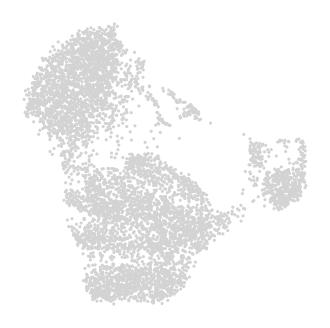

In [49]:
sc.pl.embedding(
    adata_p123,
    basis="umap",
    frameon=False,
)

In [50]:
imputed_X = palantir.utils.run_magic_imputation(adata_p123)

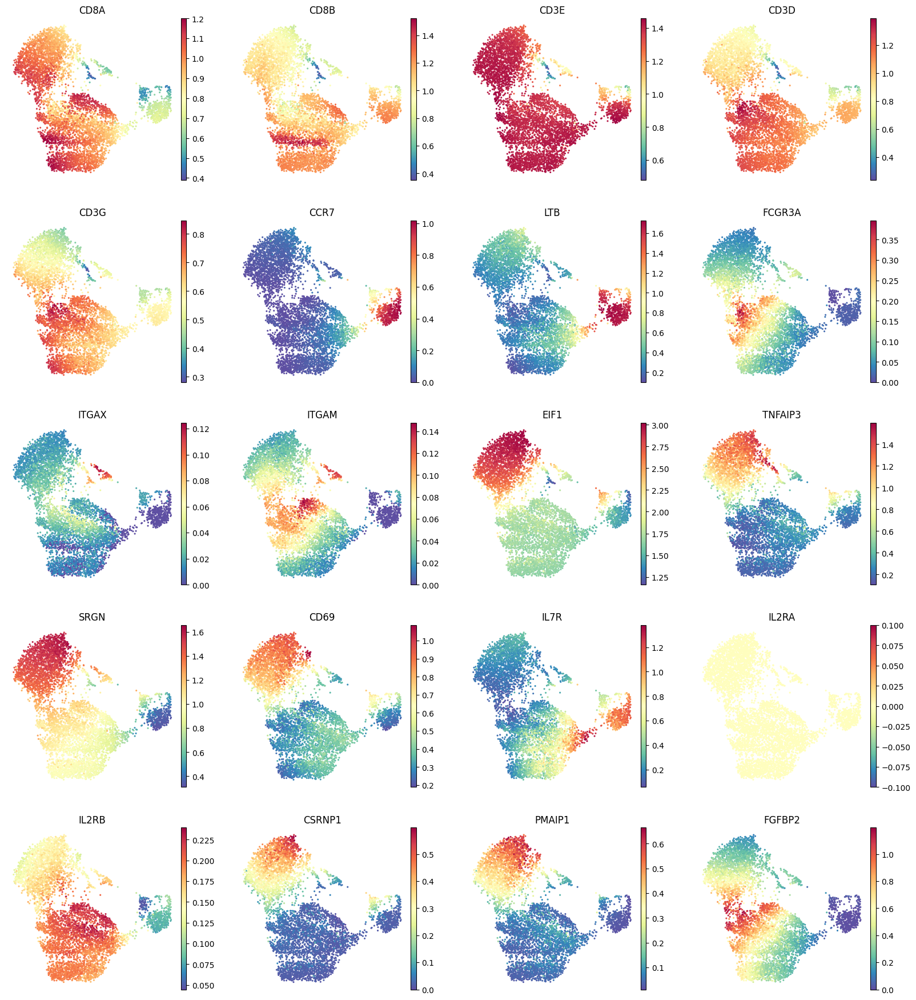

In [52]:
dup = adata_p123.obs.columns.intersection(adata_p123.var_names)
adata_p123.obs.rename(columns={c: f"{c}_obs" for c in dup}, inplace=True)
sc.pl.embedding(
    adata_p123,
    basis="umap",
    layer="MAGIC_imputed_data",
    color=["CD8A", "CD8B", "CD3E", "CD3D","CD3G", "CCR7", "LTB", "FCGR3A","ITGAX", "ITGAM", "EIF1", "TNFAIP3", "SRGN", "CD69", "IL7R", "IL2RA", "IL2RB", "CSRNP1", "PMAIP1", "FGFBP2"
],
    frameon=False, save = '_markers.pdf',
)
plt.show()

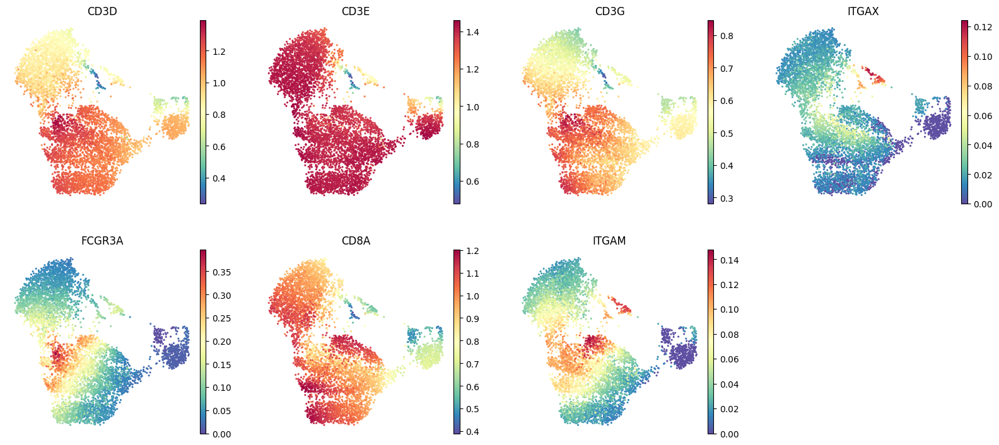

In [53]:
sc.pl.embedding(
    adata_p123,
    basis="umap",
    layer="MAGIC_imputed_data",
    color=["CD3D", "CD3E", "CD3G", "ITGAX","FCGR3A", "CD8A", "ITGAM"],
    frameon=False, save = '_markers2.pdf'
)
plt.show()

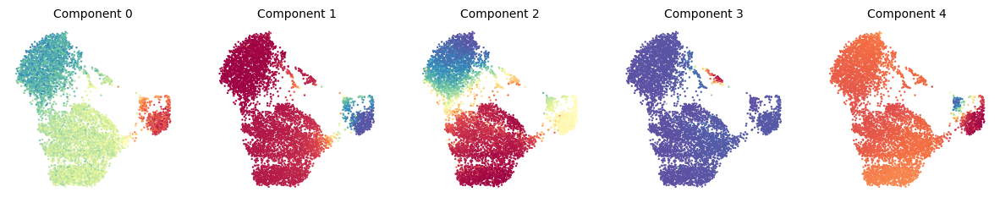

In [54]:
palantir.plot.plot_diffusion_components(adata_p123)
plt.show()

# Selecting first and last cells

In [55]:
#Select only naïve CD4+ T cells 
cells_naive_pre= adata_p123.obs[
    (adata_p123.obs['predicted.celltype.l1'] == 'CD8 T') 
].index

#  naive markers
naive_markers = ["CCR7", "CD27", "SELL" ,"TCF7","LEF1", "IL7R" ]  

naive_expr = adata_p123[cells_naive_pre, naive_markers].X

# If the matrix is sparse, convert to dense
if not isinstance(naive_expr, np.ndarray):
    naive_expr = naive_expr.toarray()

# Compute mean expression of the marker genes per cell
mean_naive_expr = np.mean(naive_expr, axis=1)

# Identify the single most naïve cell
root_cell = cells_naive_pre[np.argmax(mean_naive_expr)]
print(f"Selected root cell: {root_cell}")

Selected root cell: CIH003_reseq_ACTGTCCTCTGCTTGC-1


In [56]:
cell_id = "CIH003_reseq_ACTGTCCTCTGCTTGC-1"

# is the cell there?
if cell_id not in adata_p123.obs_names:
    raise KeyError(f"La célula {cell_id} no está en adata_p123.obs_names")

# which cell type?
display(adata_p123.obs.loc[cell_id])

AvgDistanceToRef                                        48.713886
RNA_MERGED_clusters                                             3
nCount_RNA                                                 1648.0
nGene                                                      1029.0
nUMI                                                       1648.0
percent.mito                                             4.004854
predicted.celltype.l1                                       CD8 T
predicted.celltype.l2                                   CD8 Naive
subsample                                      f. 4 Months P123RS
leiden                                                          5
leiden_res_0.20                                                 2
leiden_res_0.50                                                 4
leiden_res_0.80                                                 5
leiden_res_1.00                                                 5
cell_type_lvl1                                              Naive
CD69_obs  

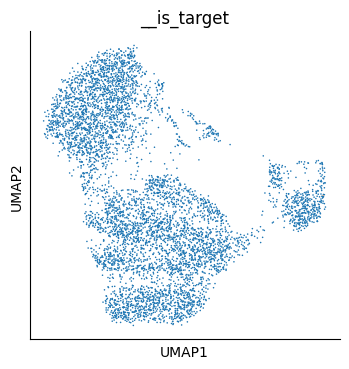

In [57]:
cell_id = "CIH003_reseq_ACTGTCCTCTGCTTGC-1"

# column for highlighting the cell
adata_p123.obs["__is_target"] = (adata_p123.obs_names == cell_id)

# Plot UMAP and color by that column
sc.pl.umap(adata_p123, color=["__is_target"], size=5, cmap="viridis", legend_loc=None)

# (optional) drop the temporary column afterwards
adata_p123.obs.drop(columns="__is_target", inplace=True)

In [58]:
# Activated effector markers
cd8_cells = adata_p123.obs[
    adata_p123.obs['predicted.celltype.l1'] == 'CD8 T'
].index

# Markers
effector_markers = ["GZMB", "PRF1", "KLRG1", "CX3CR1", "TBX21"]

# Calcular expresión media de marcadores por célula
cd8_expr = adata_p123[cd8_cells][:, effector_markers].X.mean(axis=1)

# Obtener índice de la célula con mayor expresión de marcadores efectores
effector_terminal_cell = cd8_cells[np.argmax(cd8_expr)]

print(f"Selected effector terminal cell: {effector_terminal_cell}")

Selected effector terminal cell: CIH003_reseq_ATGAGGGGTGCACCAC-1


In [59]:
terminal_states = pd.Series(
    ["Effector"],
    index=["CIH003_reseq_ATGAGGGGTGCACCAC-1"],
)

In [60]:
cell_id = "CIH003_reseq_ATGAGGGGTGCACCAC-1"

# is the cell there?
if cell_id not in adata_p123.obs_names:
    raise KeyError(f"the cell {cell_id} is not in adata_p123.obs_names")

# which cell type?
display(adata_p123.obs.loc[cell_id])

AvgDistanceToRef                                        58.568855
RNA_MERGED_clusters                                             2
nCount_RNA                                                 2827.0
nGene                                                      1354.0
nUMI                                                       2827.0
percent.mito                                              3.11284
predicted.celltype.l1                                       CD8 T
predicted.celltype.l2                                     CD8 TEM
subsample                                      f. 4 Months P123RS
leiden                                                          6
leiden_res_0.20                                                 0
leiden_res_0.50                                                 5
leiden_res_0.80                                                 6
leiden_res_1.00                                                 6
cell_type_lvl1                                               Teff
CD69_obs  

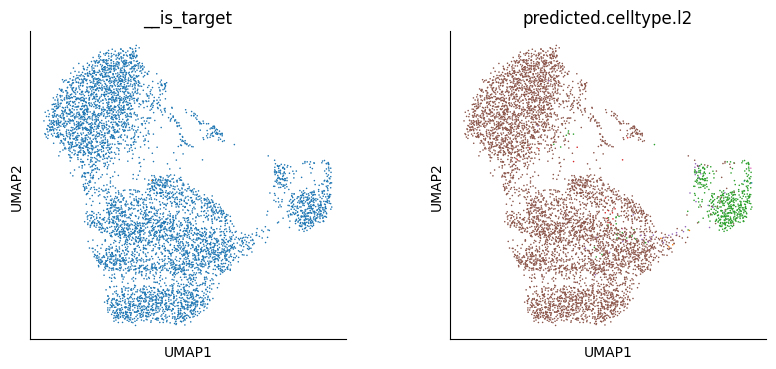

In [61]:
cell_id = "CIH003_reseq_ATGAGGGGTGCACCAC-1"

# column for highlighting the cell
adata_p123.obs["__is_target"] = (adata_p123.obs_names == cell_id)

# Plot UMAP and color by that column
sc.pl.umap(adata_p123, color=["__is_target", "predicted.celltype.l2"], size=5, cmap="viridis", legend_loc=None)

# (optional) drop the temporary column afterwards
adata_p123.obs.drop(columns="__is_target", inplace=True)

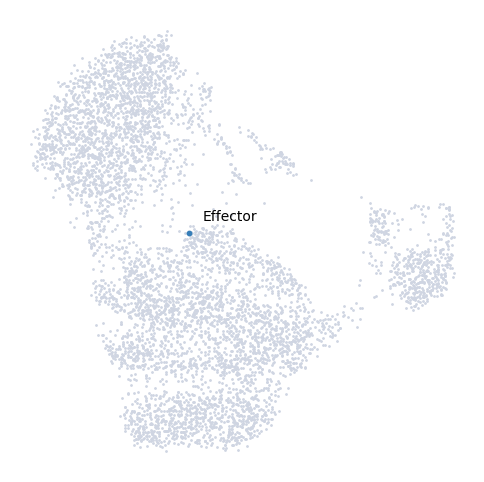

In [62]:
palantir.plot.highlight_cells_on_umap(adata_p123, terminal_states)
plt.show()

In [63]:
adata_p123.obsm['DM_EigenVectors_multiscaled'] = dm_res['EigenVectors'].values


In [64]:
start_cell = "CIH003_reseq_ACTGTCCTCTGCTTGC-1"
pr_res = palantir.core.run_palantir(
    adata_p123, start_cell, num_waypoints=500, terminal_states=terminal_states
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.004636851946512858 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.10526524782180786 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [65]:
adata_p123.obs['pseudotime'] = pr_res.pseudotime.values

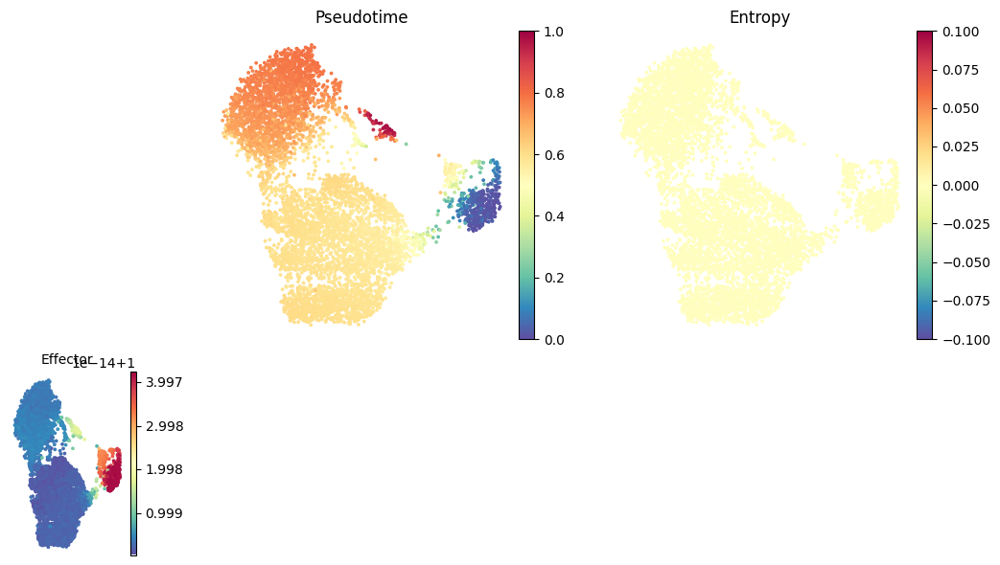

In [66]:
palantir.plot.plot_palantir_results(adata_p123, s=3)
plt.show()

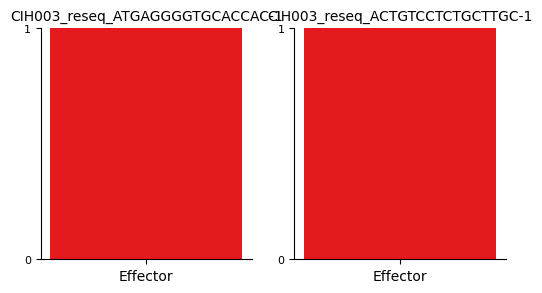

In [67]:
cells = [
  "CIH003_reseq_ATGAGGGGTGCACCAC-1", "CIH003_reseq_ACTGTCCTCTGCTTGC-1"
]

palantir.plot.plot_terminal_state_probs(adata_p123, cells)
plt.show()

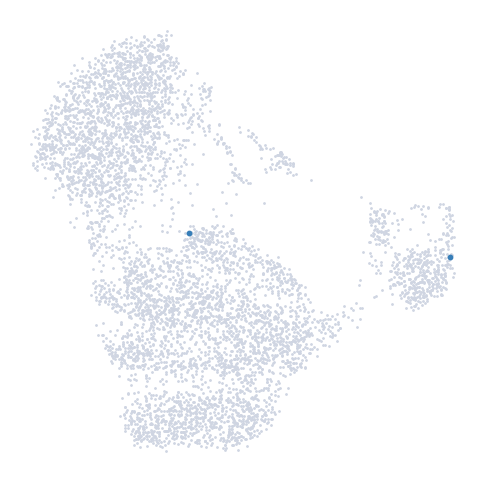

In [68]:
palantir.plot.highlight_cells_on_umap(adata_p123, cells)
plt.show()

In [69]:
masks = palantir.presults.select_branch_cells(adata_p123, q=.01, eps=.01)

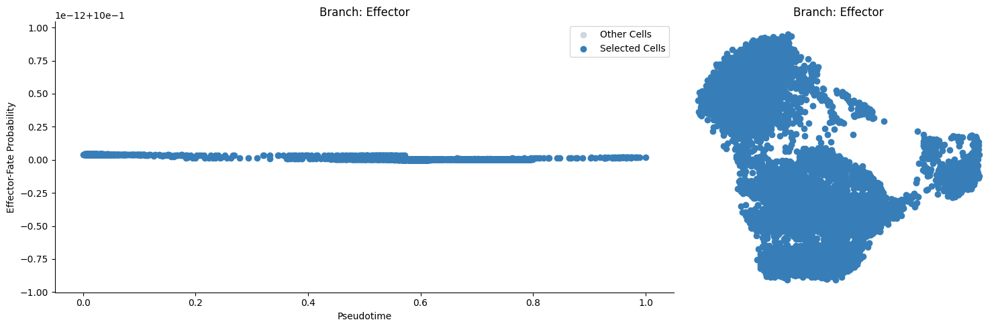

In [70]:
palantir.plot.plot_branch_selection(adata_p123)
plt.show()

[2025-11-25 18:22:30,154] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (5,934) and rank = 1.0.
[2025-11-25 18:22:30,155] [INFO    ] Using covariance function Matern52(ls=0.9557862281799316).
[2025-11-25 18:22:30,185] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-11-25 18:22:31,282] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Effector'}>

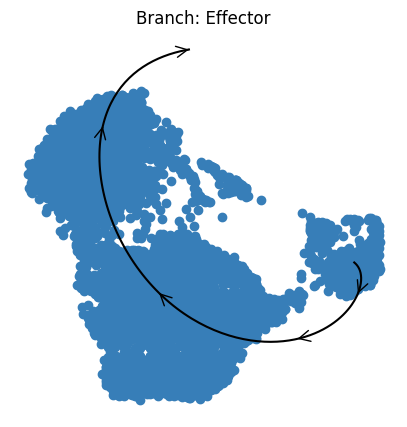

In [71]:
palantir.plot.plot_trajectory(adata_p123, "Effector")

[2025-11-25 18:22:32,053] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (5,934) and rank = 1.0.
[2025-11-25 18:22:32,053] [INFO    ] Using covariance function Matern52(ls=0.9557862281799316).
[2025-11-25 18:22:32,054] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-11-25 18:22:32,105] [INFO    ] Sigma interpreted as element-wise standard deviation.


<Axes: title={'center': 'Branch: Effector'}, xlabel='UMAP1', ylabel='UMAP2'>

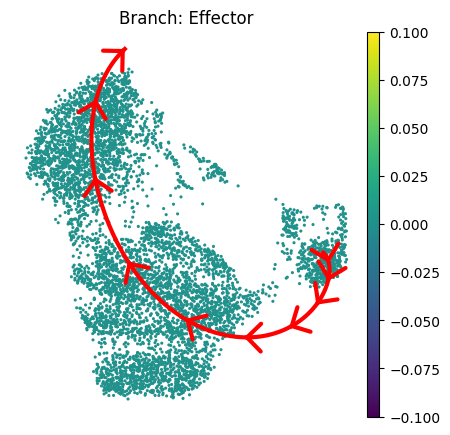

In [72]:
palantir.plot.plot_trajectory(
    adata_p123, # your anndata
    "Effector", # the branch to plot
    cell_color="palantir_entropy", # the ad.obs colum to color the cells by
    n_arrows=10, # the number of arrow heads along the path
    color="red", # the color of the path and arrow heads
    scanpy_kwargs=dict(cmap="viridis"), # arguments passed to scanpy.pl.embedding
    arrowprops=dict(arrowstyle="->,head_length=.5,head_width=.5", lw=3), # appearance of the arrow heads
    lw=3, # thickness of the path
    pseudotime_interval=(0, .9), # interval of the pseudotime to cover with the path
)

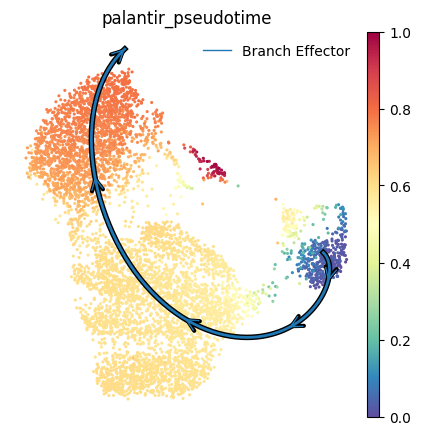

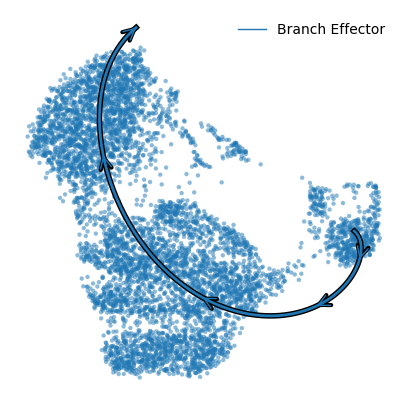

In [73]:
palantir.plot.plot_trajectories(adata_p123, pseudotime_interval=(0, .9))
# When using cell_color="branch_selection" be aware of the overlap between branches:
palantir.plot.plot_trajectories(adata_p123, cell_color = "branch_selection", pseudotime_interval=(0, .9))
plt.show()

In [74]:
gene_trends = palantir.presults.compute_gene_trends(
    adata_p123,
    expression_key="MAGIC_imputed_data",
)

Effector
[2025-11-25 18:22:43,450] [INFO    ] Using sparse Gaussian Process since n_landmarks (500) < n_samples (5,934) and rank = 1.0.
[2025-11-25 18:22:43,450] [INFO    ] Using covariance function Matern52(ls=1.0).
[2025-11-25 18:22:44,591] [INFO    ] Sigma interpreted as element-wise standard deviation.


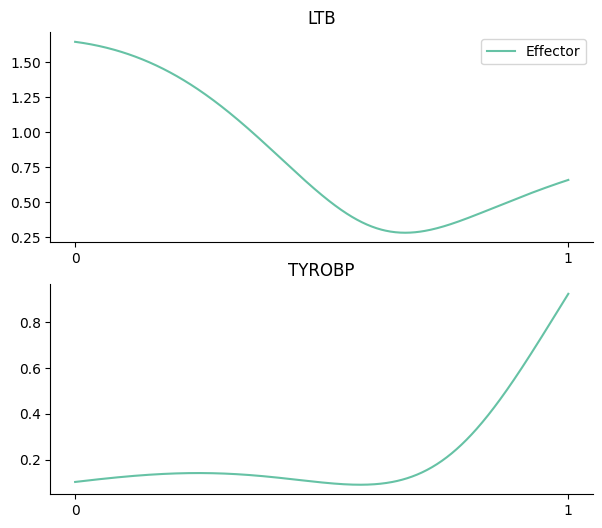

In [75]:
genes = ["LTB", "TYROBP"]
palantir.plot.plot_gene_trends(adata_p123, genes)
plt.show()

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


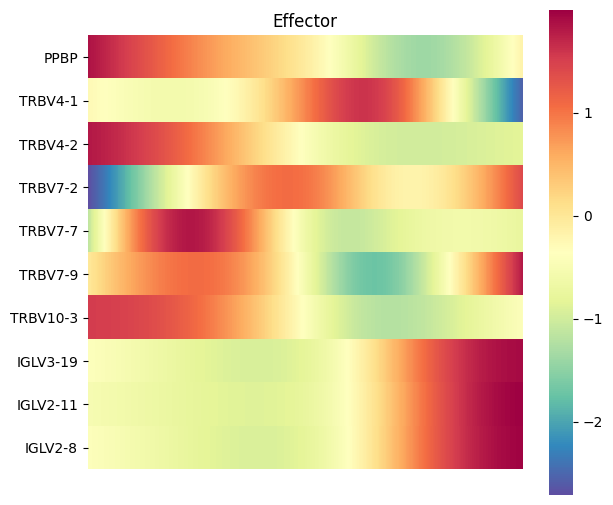

In [76]:
# Asegúrate de haber corrido este paso antes
sc.pp.highly_variable_genes(adata_p123, n_top_genes=10)

# Selecciona solo los genes marcados como altamente variables
top_genes = adata_p123.var[adata_p123.var['highly_variable']].index.tolist()

palantir.plot.plot_gene_trend_heatmaps(adata_p123, genes=top_genes)
plt.show()

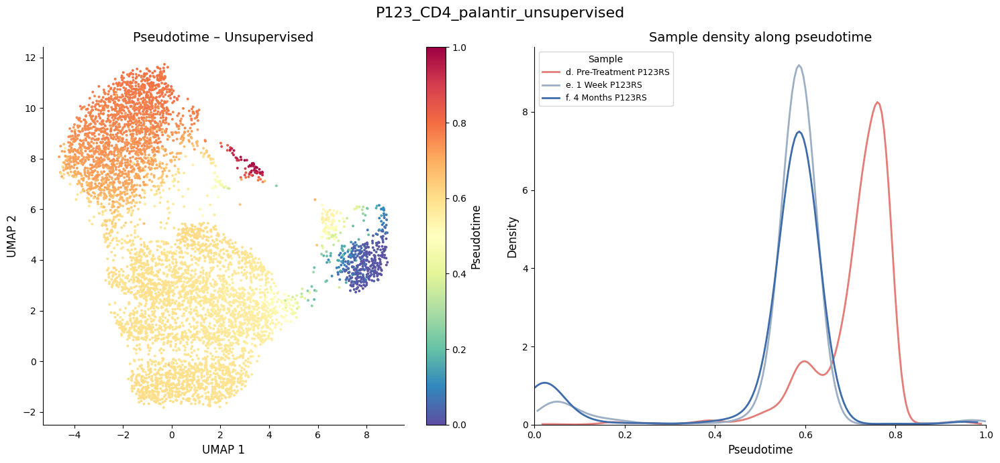

Saved: /lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/P123_CD8/P123_CD4_palantir_unsupervised.pdf


In [78]:
import os
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
from scipy.stats import gaussian_kde

# --------------------------------------------------
# CONFIGURATION
# --------------------------------------------------
out_dir = "/lustre1/project/stg_00187/users/Cecilia/Data/5_Trajectory/v4/P123_CD8"  # <- change if needed
sl_name = "P123_CD8_palantir_unsupervised"                                         # <- change if needed
os.makedirs(out_dir, exist_ok=True)

embedding_key = "X_umap"                # or "X_pca", "X_diffmap", etc.
X = adata_p123.obsm[embedding_key]      # shape (n_cells, 2)
sample_labels = adata_p123.obs["subsample"]

# Single (unsupervised) pseudotime vector
pseudotime = adata_p123.obs["pseudotime"].values  # <- adapt to your key

# Colormap and normalization for pseudotime
cmap = plt.get_cmap("Spectral_r")
valid = ~np.isnan(pseudotime)
norm = Normalize(vmin=np.nanmin(pseudotime[valid]), vmax=np.nanmax(pseudotime[valid]))

# --------------------------------------------------
# DEFINE COLORS FOR SUBSAMPLES (coral, gray, navy)
# --------------------------------------------------
unique_samples = sorted(sample_labels.unique())
# Assume there are exactly 3 subsamples
subsample_palette = {
    unique_samples[0]: "#e47c77",  # coral
    unique_samples[1]: "#9dafc5",  # gray
    unique_samples[2]: "#3e6cab",  # navy
}

# If you prefer explicit mapping instead of sorted order, use:
# subsample_palette = {
#     "a. Pre-Treatment P116RS": "#FF7F50",  # coral
#     "b. 1 Week P116RS":       "#808080",  # gray
#     "c. 4 Months P116RS":     "#000080",  # navy
# }

# --------------------------------------------------
# CREATE FIGURE (1x2 layout)
# --------------------------------------------------
fig, (ax_scatter, ax_density) = plt.subplots(1, 2, figsize=(15, 7))  # ~1500x750 px at 100 dpi

# -------------------------------
# LEFT: EMBEDDING COLORED BY PT
# -------------------------------
# Default: light gray for NaNs
colors = np.empty((len(pseudotime), 4))   # RGBA
colors[:] = (0.9, 0.9, 0.9, 0.3)

colors[valid] = cmap(norm(pseudotime[valid]))

sc = ax_scatter.scatter(
    X[:, 0], X[:, 1],
    c=colors,
    s=8,
    linewidths=0
)

sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax_scatter)
cbar.set_label("Pseudotime", fontsize=12)

ax_scatter.set_title("Pseudotime – Unsupervised", fontsize=14)
ax_scatter.set_xlabel("UMAP 1", fontsize=12)
ax_scatter.set_ylabel("UMAP 2", fontsize=12)

# -------------------------------
# RIGHT: SAMPLE DENSITY PLOTS
# -------------------------------
densities = {}
x_min, x_max = np.inf, -np.inf
y_max = 0

for samp in sample_labels.unique():
    mask = (sample_labels == samp) & valid
    values = pseudotime[mask]

    if np.sum(mask) < 5:
        # too few points to estimate a density reliably
        continue

    kde = gaussian_kde(values)
    xs = np.linspace(values.min(), values.max(), 200)
    ys = kde(xs)

    densities[samp] = (xs, ys)

    x_min = min(x_min, xs.min())
    x_max = max(x_max, xs.max())
    y_max = max(y_max, ys.max())

if len(densities) > 0:
    ax_density.set_xlim(x_min, x_max)
    ax_density.set_ylim(0, y_max * 1.05)

    for samp, (xs, ys) in densities.items():
        # use subsample-specific color (coral, gray, navy)
        col = subsample_palette.get(samp, "#000000")
        ax_density.plot(xs, ys, linewidth=2, label=samp, color=col)

ax_density.set_xlabel("Pseudotime", fontsize=12)
ax_density.set_ylabel("Density", fontsize=12)
ax_density.set_title("Sample density along pseudotime", fontsize=14)
ax_density.legend(title="Sample", fontsize=9, title_fontsize=10)

fig.suptitle(f"{sl_name}", fontsize=16)
fig.tight_layout()

# --------------------------------------------------
# SAVE PDF
# --------------------------------------------------
out_file = os.path.join(out_dir, f"{sl_name}.pdf")
fig.savefig(out_file, bbox_inches="tight")
plt.show()
plt.close(fig)

print(f"Saved: {out_file}")


In [ ]:
"""# Diffusion map
dm_res = palantir.utils.run_diffusion_maps(pca_embedding, n_components=5)

# Elegir una célula raíz
cells_naive_pre = adata_p123.obs[
    (adata_p123.obs['cell_type_lvl1'] == 'naive') &
    (adata_p123.obs['subsample'] == "a. Pre-Treatment p123RS")
]

# Seleccionar la primera célula raíz
root_cell = cells_naive_pre.index[0]


# Pseudotime
ms_data = palantir.utils.determine_multiscale_space(dm_res)
palantir_res = palantir.core.run_palantir(ms_data, root_cell)

# Guardar pseudotime
adata_p123.obs['pseudotime'] = palantir_res.pseudotime.values"""

# Genes on pseudotime from cytotoxic branch

In [ ]:
# Definir célular citotóxicas por la branch
target_fate = "Effector"
threshold = 0.5

cells_cyto = pr_res.branch_probs.index[
    pr_res.branch_probs[target_fate] > threshold
]

# Extraer el pseudotime ya calculado para estas células
pseudotime_cyto = adata_p123.obs.loc[cells_cyto, 'pseudotime'].values

# Extraer expresión
X = adata_p123[cells_cyto, :].X
gene_names = adata_p123.var_names
X = pd.DataFrame(X, columns=gene_names, index=cells_cyto)

# Eliminar genes que sean todo ceros
genes_to_test = X.columns[X.sum(axis=0) > 0]

In [ ]:
pvals = []
r2_scores = []
smooth_values = []

# Convertir pseudotime a 2D para pygam
X_pt = pseudotime_cyto.reshape(-1, 1)

# Grid común para predicción (100 puntos equiespaciados)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

# Ajustar modelos GAM por gen
for gene in tqdm(genes_to_test, desc="Fitting GAMs"):
    y = X[gene].values
    model = GAM(s(0)).fit(X_pt, y)
    
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])
    
    smooth = model.predict(grid)
    smooth_values.append(smooth)


In [ ]:
# Ajuste de p-valores
_, adj_pvals, _, _ = multipletests(pvals, method='fdr_bh')

# Guardar resultados
gam_results = pd.DataFrame({
    'gene': genes_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('gene')

# Filtrar por significancia (p.adj < 0.01)
significant_genes = gam_results[gam_results['adj_pval'] < 0.01].index.tolist()

# Expresiones suavizadas para genes significativos
smooth_matrix = np.array([smooth_values[i] for i, gene in enumerate(genes_to_test) if gene in significant_genes])

In [ ]:
# Manhattan distance
dist_mat = pdist(smooth_matrix, metric='cityblock')
linkage_mat = linkage(dist_mat, method='average')

# Asignar clústeres
clusters = fcluster(linkage_mat, t=6, criterion='maxclust')

In [ ]:
# Crear dataframe con anotaciones
heatmap_df = pd.DataFrame(smooth_matrix, index=significant_genes)
heatmap_df['cluster'] = clusters
heatmap_df = heatmap_df.sort_values('cluster')
heatmap_values = heatmap_df.drop(columns='cluster')

# Opcional: genes a anotar

label_genes = ["STAT1", "GATA1", "MPO", "IRF8"]
heatmap_values_filtered = heatmap_values.loc[heatmap_values.index.intersection(label_genes)]

# Generar heatmap
plt.figure(figsize=(10, 20))
sns.heatmap(
    heatmap_values,
    cmap='viridis',       
    yticklabels=label_genes,     
    xticklabels=False
)

plt.xlabel("Pseudotime")
plt.ylabel("genes")
plt.tight_layout()
plt.show()

In [ ]:
# Crear DataFrame (filas = genes, columnas = pseudotime interpolado)
smooth_df = pd.DataFrame(smooth_matrix, index=significant_genes)

g = sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(18, 30),
    yticklabels=True,
    xticklabels=False,
)

# Cambiar el tamaño de fuente de las etiquetas de los genes
g.ax_heatmap.set_yticklabels(g.ax_heatmap.get_yticklabels(), fontsize=4)

plt.title("Significant genes across pseudotime")
plt.show()

In [ ]:
smooth_df_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df),
    index=smooth_df.index,
    columns=smooth_df.columns
)
top_n = 30  # Muestra los 30 más dinámicos

top_genes = gam_results.loc[significant_genes].sort_values('r2', ascending=False).head(top_n).index.tolist()
filtered_df = smooth_df.loc[top_genes]

sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic genes (by R²)")
plt.show()

In [ ]:
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"}

In [ ]:
# Crear la columna treatment_group solo para las células citotóxicas
adata_p123.obs.loc[cells_cyto, 'treatment_group'] = adata_p123.obs.loc[cells_cyto, 'subsample'].map(group_map)

# Filtrar solo las células citotóxicas con grupo válido
filtered = adata_p123.obs.loc[cells_cyto].dropna(subset=['treatment_group']).copy()

# Usar el pseudotime ya calculado (pseudotime_cyto)
filtered['pseudotime_cyto'] = pseudotime_cyto[:len(filtered)]


group_means = filtered.groupby('treatment_group')['pseudotime_cyto'].mean()


print(group_means)

In [ ]:
# Definir pseudo_lin usando la grilla existente
pseudo_lin = grid

# Asignar a cada punto el grupo más cercano según pseudotime medio
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

In [ ]:
palette = {
    "Pre-Treatment": "#1f77b4",    # azul
    "1 Week After": "#ff7f0e",  # naranja
    "4 Months After": "#2ca02c"    # verde
}

In [ ]:
col_colors = pd.Series(group_labels, index=range(100)).map(palette)

In [ ]:
print(pd.Series(group_labels).value_counts())

In [ ]:
import matplotlib.patches as mpatches
g = sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 10),
    yticklabels=True,
    xticklabels=False,
    col_colors=col_colors
)

# Agregar leyenda para los time points (col_colors)
handles_col = [
    mpatches.Patch(color=color, label=label)
    for label, color in palette.items()
]
# Leyenda para columnas (time points)
g.ax_col_dendrogram.legend(
    handles=handles_col,
    loc="center",
    bbox_to_anchor=(0.5, 0.5),
    ncol=3,
    fontsize="medium"
)
cbar = g.cax
cbar.tick_params(labelsize=10)  
cbar.set_ylabel("Expression", fontsize=10, labelpad=10)  
cbar.set_aspect(1) 
plt.show()

# Regulons along pseudotime from cytotoxic branch

In [ ]:
# --- 1. Extraer los valores de AUC solo para las células citotóxicas ---
cells_mask = adata_p123.obs_names.isin(cells_cyto)

regulon_names = list(adata_p123.uns['Regulons_tuples'].dtype.names)
regulon_auc_df = pd.DataFrame(
    adata_p123.obsm['RegulonsAUC'][cells_mask, :],
    columns=regulon_names,
    index=adata_p123.obs_names[cells_mask]
)

# --- 2. Asegurar que los valores sean numéricos ---
regulon_auc_df = regulon_auc_df.apply(pd.to_numeric, errors='coerce').fillna(0)

# --- 3. Crear Series de pseudotime con el mismo índice ---
pseudotime_cyto = adata_p123.obs.loc[cells_cyto, "pseudotime"]
pseudotime_cyto = pd.Series(pseudotime_cyto.values, index=regulon_auc_df.index)

In [ ]:
gam_results = {}

for regulon in tqdm(regulon_auc_df.columns, desc="Fitting GAMs on regulons"):
    y = regulon_auc_df[regulon].values
    x = pseudotime_cyto.values.reshape(-1, 1)

    # Evitar errores por datos sin varianza o con NaNs
    if np.all(y == 0) or np.var(y) == 0 or np.isnan(y).any():
        continue

    gam = GAM(s(0, n_splines=5)).fit(x, y)
    y_pred = gam.predict(x)

    gam_results[regulon] = {
        'model': gam,
        'y_pred': y_pred,
        'y_var': np.var(y_pred),
        'auc_range': y_pred.max() - y_pred.min()
    }

print(f"Modelados {len(gam_results)} regulones con éxito.")

In [ ]:
# Crear una matriz de predicciones normalizadas
n_points = 100
pseudo_lin = np.linspace(pseudotime_cyto.min(), pseudotime_cyto.max())

smooth_df = pd.DataFrame()
for regulon, res in gam_results.items():
    y_smooth = res['model'].predict(pseudo_lin)
    smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)

smooth_df = smooth_df.T  # Transponer
smooth_df.index = list(gam_results.keys()) 

# Clustermap estilo Seurat heatmap
sns.clustermap(smooth_df, cmap='viridis', col_cluster=False, figsize=(12, 8))
plt.title("Regulon dynamics across pseudotime")
plt.show()

In [ ]:
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"}

In [ ]:
# Crear columna de grupo de tratamiento para las células citotóxicas
adata_p123.obs.loc[cells_cyto, "treatment_group"] = (
    adata_p123.obs.loc[cells_cyto, "subsample"].map(group_map)
)

# Filtrar solo las células citotóxicas con tratamiento válido
filtered = adata_p123.obs.loc[
    adata_p123.obs_names.isin(cells_cyto) &
    adata_p123.obs["treatment_group"].notna(),
    ["treatment_group", "pseudotime"]
]

# Agrupar por grupo y obtener pseudotime promedio
group_means = filtered.groupby("treatment_group")["pseudotime"].mean()

print(group_means)


In [ ]:
# Para cada punto en pseudo_lin, asignar el grupo de tratamiento más cercano
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

In [ ]:
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = pd.Series(group_labels, index=smooth_df.columns).map(palette)

In [ ]:
sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    col_colors=col_colors
)
plt.title("Regulon dynamics across pseudotime with treatment groups")
plt.show()

# Genes on pseudotime recalculated on the cytotoxic branch only

In [ ]:
# defining the destiny of one branch
target_fate = "Effector"   
threshold = 0.5             

cells_cyto = pr_res.branch_probs.index[pr_res.branch_probs[target_fate] > threshold]
adata_cyto = adata_p123[cells_cyto, :].copy()  
terminal_cyto = terminal_states.loc[terminal_states == 'Effector']

In [ ]:
pr_res_cyto = palantir.core.run_palantir(
    adata_cyto,
    start_cell,
    terminal_states=terminal_cyto,
    num_waypoints=300
)

In [ ]:
adata_cyto.obs['pseudotime_cyto'] = pr_res_cyto.pseudotime.values

In [ ]:
adata_cyto.obs

In [ ]:
X = adata_cyto.raw.X if adata_cyto.raw is not None else adata_cyto.X
gene_names = adata_cyto.raw.var_names if adata_cyto.raw is not None else adata_cyto.var_names
X = pd.DataFrame(X, columns=gene_names, index=adata_cyto.obs_names)

In [ ]:
genes_to_test = X.columns[X.sum(axis=0) > 0]
print(f"Genes a modelar: {len(genes_to_test)}")

In [ ]:
pvals = []
r2_scores = []
smooth_values = []

# Pseudotime 2D
X_pt = adata_cyto.obs["pseudotime_cyto"].values.reshape(-1, 1)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

for gene in tqdm(genes_to_test, desc="Fitting GAMs"):
    y = X[gene].values
    model = GAM(s(0)).fit(X_pt, y)
    
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])
    
    smooth = model.predict(grid)
    smooth_values.append(smooth)


In [ ]:
# Ajuste de p-valores
_, adj_pvals, _, _ = multipletests(pvals, method='fdr_bh')

# Guardar resultados
gam_results = pd.DataFrame({
    'gene': genes_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('gene')

# Filtrar por significancia (p.adj < 0.01)
significant_genes = gam_results[gam_results['adj_pval'] < 0.01].index.tolist()

# Expresiones suavizadas para genes significativos
smooth_matrix = np.array([smooth_values[i] for i, gene in enumerate(genes_to_test) if gene in significant_genes])


In [ ]:
# Manhattan distance
dist_mat = pdist(smooth_matrix, metric='cityblock')
linkage_mat = linkage(dist_mat, method='average')

# Asignar clústeres
clusters = fcluster(linkage_mat, t=6, criterion='maxclust')


In [ ]:
# Crear dataframe con anotaciones
heatmap_df = pd.DataFrame(smooth_matrix, index=significant_genes)
heatmap_df['cluster'] = clusters
heatmap_df = heatmap_df.sort_values('cluster')
heatmap_values = heatmap_df.drop(columns='cluster')

# Opcional: genes a anotar

label_genes = ["STAT1", "GATA1", "MPO", "IRF8"]
heatmap_values_filtered = heatmap_values.loc[heatmap_values.index.intersection(label_genes)]

# Generar heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(
    heatmap_values,
    cmap='viridis',       
    yticklabels=label_genes,     
    xticklabels=False
)

plt.xlabel("Pseudotime")
plt.ylabel("genes")
plt.tight_layout()
plt.show()


In [ ]:
# Crear DataFrame (filas = genes, columnas = pseudotime interpolado)
smooth_df = pd.DataFrame(smooth_matrix, index=significant_genes)

# Clustermap
sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,     # No agrupar columnas (pseudotime)
    figsize=(12, 8),
    yticklabels=True
)

plt.title("Significant genes across pseudotime")
plt.show()

In [ ]:
smooth_df_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df),
    index=smooth_df.index,
    columns=smooth_df.columns
)
top_n = 30  # Muestra los 30 más dinámicos

top_genes = gam_results.loc[significant_genes].sort_values('r2', ascending=False).head(top_n).index.tolist()
filtered_df = smooth_df.loc[top_genes]

sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic genes (by R²)")
plt.show()

In [ ]:
"STAT1" in adata_cyto.var_names

In [ ]:
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"}

In [ ]:
# Crear una columna con la fase del tratamiento
adata_cyto.obs['treatment_group'] = adata_cyto.obs['subsample'].map(group_map)

# Quitar células que no están en el mapeo
filtered = adata_cyto.obs.dropna(subset=['treatment_group'])

# Agrupar por grupo y obtener el pseudotime promedio
group_means = filtered.groupby('treatment_group')['pseudotime_cyto'].mean()
print(group_means)

In [ ]:
# Definir pseudo_lin usando la grilla existente
pseudo_lin = grid

# Asignar a cada punto el grupo más cercano según pseudotime medio
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

In [ ]:
palette = {
    "Pre-Treatment": "#1f77b4",    # azul
    "1 Week After": "#ff7f0e",  # naranja
    "4 Months After": "#2ca02c"    # verde
}

In [ ]:
col_colors = pd.Series(group_labels, index=range(100)).map(palette)

In [ ]:
print(pd.Series(group_labels).value_counts())

In [ ]:
import matplotlib.patches as mpatches
g = sns.clustermap(
    filtered_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 10),
    yticklabels=True,
    xticklabels=False,
    col_colors=col_colors
)

# Agregar leyenda para los time points (col_colors)
handles_col = [
    mpatches.Patch(color=color, label=label)
    for label, color in palette.items()
]
# Leyenda para columnas (time points)
g.ax_col_dendrogram.legend(
    handles=handles_col,
    loc="center",
    bbox_to_anchor=(0.5, 0.5),
    ncol=3,
    fontsize="medium"
)
cbar = g.cax
cbar.tick_params(labelsize=10)  
cbar.set_ylabel("Expression", fontsize=10, labelpad=10)  
cbar.set_aspect(1) 
plt.show()

# Regulons AUC on pseudotime

In [ ]:
regulons_array = adata.uns['Regulons_tuples']
print(regulons_array.dtype)

In [ ]:
regulon_auc = adata_cyto.obsm['RegulonsAUC']  # shape: cells x regulons
regulon_names = list(adata_cyto.uns['Regulons_tuples'].dtype.names)
regulon_auc_df = pd.DataFrame(regulon_auc, columns=regulon_names, index=adata_cyto.obs_names)
pseudotime = adata_cyto.obs['pseudotime_cyto']


In [ ]:
# Crear DataFrame con nombres de regulones
regulon_names = list(adata_cyto.uns['Regulons_tuples'].dtype.names)
regulon_auc_df = pd.DataFrame(adata_cyto.obsm['RegulonsAUC'], columns=regulon_names, index=adata_cyto.obs_names)

# Asegurar que los valores sean numéricos
regulon_auc_df = regulon_auc_df.apply(pd.to_numeric, errors='coerce')

# Rellenar NaNs con 0 para evitar errores en np.isnan
regulon_auc_df = regulon_auc_df.fillna(0)


In [ ]:
from pygam import GAM, s

# Para cada regulón
gam_results = {}
for regulon in regulon_auc_df.columns:
    y = regulon_auc_df[regulon].values
    x = pseudotime.values.reshape(-1, 1)

    if y.sum() == 0 or np.isnan(y).any():
        continue

    gam = GAM(s(0, n_splines=5)).fit(x, y)
    y_pred = gam.predict(x)

    gam_results[regulon] = {
        'model': gam,
        'y_pred': y_pred,
        'y_var': np.var(y_pred),
        'auc_range': y_pred.max() - y_pred.min()
    }


In [ ]:
# Crear una matriz de predicciones normalizadas
n_points = 100
pseudo_lin = np.linspace(pseudotime.min(), pseudotime.max())

smooth_df = pd.DataFrame()
for regulon, res in gam_results.items():
    y_smooth = res['model'].predict(pseudo_lin)
    smooth_df[regulon] = (y_smooth - np.mean(y_smooth)) / np.std(y_smooth)

smooth_df = smooth_df.T  # Transponer
smooth_df.index = list(gam_results.keys()) 

# Clustermap estilo Seurat heatmap
sns.clustermap(smooth_df, cmap='viridis', col_cluster=False, figsize=(12, 8))
plt.title("Regulon dynamics across pseudotime")
plt.show()

# Regulons on pseudotime by time point

In [ ]:
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"}


In [ ]:
print(adata_cyto.obs['subsample'].unique())
print(group_map.keys())

In [ ]:
# Crear una columna con la fase del tratamiento
adata_cyto.obs['treatment_group'] = adata_cyto.obs['subsample'].map(group_map)

# Quitar células que no están en el mapeo
filtered = adata_cyto.obs.dropna(subset=['treatment_group'])

# Agrupar por grupo y obtener el pseudotime promedio
group_means = filtered.groupby('treatment_group')['pseudotime_cyto'].mean()
print(group_means)


In [ ]:
# Para cada punto en pseudo_lin, asignar el grupo de tratamiento más cercano
group_labels = []
for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)


In [ ]:
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = pd.Series(group_labels, index=smooth_df.columns).map(palette)


In [ ]:
import matplotlib.patches as mpatches
g = sns.clustermap(
    smooth_df,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    xticklabels=False,
    col_colors=col_colors
)

# Agregar leyenda para los time points (col_colors)
handles_col = [
    mpatches.Patch(color=color, label=label)
    for label, color in palette.items()
]
# Leyenda para columnas (time points)
g.ax_col_dendrogram.legend(
    handles=handles_col,
    loc="center",
    bbox_to_anchor=(0.5, 0.5),
    ncol=3,
    fontsize="medium"
)
cbar = g.cax
cbar.tick_params(labelsize=10)  
cbar.set_ylabel("Expression", fontsize=10, labelpad=10)  
cbar.set_aspect(1) 
plt.show()

# Complete anlysis of regulons

In [ ]:
# ---------------------------------------------
# 🔹 Variables iniciales
# ---------------------------------------------
pvals = []
r2_scores = []
smooth_values = []
regulons_to_test = regulon_auc_df.columns

# Convertir pseudotime a 2D para pygam
X_pt = pseudotime.values.reshape(-1, 1)

# Grid común para predicción (100 puntos equiespaciados)
grid = np.linspace(X_pt.min(), X_pt.max(), 100).reshape(-1, 1)

# ---------------------------------------------
# 🔹 Ajustar modelos GAM por regulón
# ---------------------------------------------
for regulon in tqdm(regulons_to_test, desc="Fitting GAMs on regulons"):
    y = regulon_auc_df[regulon].values

    # Evitar regulones sin varianza o con NaNs
    if np.all(y == 0) or np.var(y) == 0 or np.isnan(y).any():
        pvals.append(np.nan)
        r2_scores.append(np.nan)
        smooth_values.append(np.zeros(len(grid)))
        continue

    model = GAM(s(0)).fit(X_pt, y)

    # Guardar estadísticas
    pvals.append(model.statistics_['p_values'][1])
    r2_scores.append(model.statistics_['pseudo_r2']['explained_deviance'])

    # Predicción suavizada
    smooth = model.predict(grid)
    smooth_values.append(smooth)

# ---------------------------------------------
# 🔹 Corrección por FDR
# ---------------------------------------------
_, adj_pvals, _, _ = multipletests(
    [p for p in pvals if not np.isnan(p)],
    method='fdr_bh'
)

regulon_gam_results = pd.DataFrame({
    'regulon': regulons_to_test,
    'pval': pvals,
    'adj_pval': adj_pvals,
    'r2': r2_scores
}).set_index('regulon')

# Filtrar por significancia (p.adj < 0.01)
significant_regulons = regulon_gam_results[
    regulon_gam_results['adj_pval'] < 0.01
].index.tolist()

print(f"✅ {len(significant_regulons)} regulones significativos (adj_p < 0.01)")

# ---------------------------------------------
# 🔹 Clustering jerárquico por dinámica suavizada
# ---------------------------------------------
smooth_matrix = np.array([
    smooth_values[i] for i, r in enumerate(regulons_to_test)
    if r in significant_regulons
])

# Calcular distancias Manhattan y clustering
if len(significant_regulons) > 1:
    dist_mat = pdist(smooth_matrix, metric='cityblock')
    linkage_mat = linkage(dist_mat, method='average')
    clusters = fcluster(linkage_mat, t=6, criterion='maxclust')
    regulon_gam_results.loc[significant_regulons, 'cluster'] = clusters
else:
    linkage_mat, clusters = None, None




In [ ]:
smooth_df_auc = pd.DataFrame(smooth_matrix, index=significant_regulons)

smooth_df__auc_scaled = pd.DataFrame(
    StandardScaler().fit_transform(smooth_df_auc),
    index=smooth_df_auc.index,
    columns=smooth_df_auc.columns
)

top_n = 30
top_regulons = (
    regulon_gam_results
    .loc[significant_regulons]
    .sort_values('r2', ascending=False)
    .head(top_n)
    .index.tolist()
)
filtered_df_auc = smooth_df__auc_scaled.loc[top_regulons]

sns.clustermap(
    filtered_df_auc,
    cmap='viridis',
    col_cluster=False,
    figsize=(12, 8),
    yticklabels=True
)
plt.title(f"Top {top_n} pseudotime-dynamic AUC (by R²)")
plt.show()

In [ ]:
n_points = 100
pseudo_lin = np.linspace(pseudotime_cyto.min(), pseudotime_cyto.max(), n_points)
group_labels = []

for pt in pseudo_lin:
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)
    
group_map = {
    "d. Pre-Treatment P123RS": "Pre-Treatment",
    "e. 1 Week P123RS": "1 Week After",
    "f. 4 Months P123RS": "4 Months After"
}

adata_cyto.obs["treatment_group"] = adata_cyto.obs["subsample"].map(group_map)

# Promedio de pseudotime por grupo
group_means = adata_cyto.obs.groupby("treatment_group")["pseudotime_cyto"].mean().sort_values()
print(group_means)

# Asignar grupo más cercano a cada punto del pseudotime lineal
group_labels = []
for pt in pseudo_lin.flatten():
    closest_group = group_means.index[np.argmin(np.abs(group_means.values - pt))]
    group_labels.append(closest_group)

# Colores para cada grupo
palette = {
    "Pre-Treatment": "#1f77b4",
    "1 Week After": "#ff7f0e",
    "4 Months After": "#2ca02c"
}
col_colors = [palette[g] for g in group_labels]

# -----------------------------------------------------------
# 🔹 Clustermap final con colores por tratamiento
# -----------------------------------------------------------
sns.clustermap(
    filtered_df_auc,
    cmap="viridis",
    col_cluster=False,  # mantiene el orden temporal
    figsize=(12, 8),
    col_colors=col_colors,
    yticklabels=True
)

plt.title(f"Top {top_n} regulons dynamics across pseudotime with treatment groups")
plt.xlabel("Pseudotime")
plt.ylabel("Regulons")
plt.show()

# Regulons one by one

In [ ]:
regulons_to_plot = ['IRF1(+)', 'IRF4(+)', 'IRF7(+)','STAT1(+)']

# Identidad celular (usada para colorear los puntos)
cell_groups = adata_cyto.obs['predicted.celltype.l1']  # ajusta si se llama diferente

# Crear subplots
n_cols = 4
n_rows = int(np.ceil(len(regulons_to_plot) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4, n_rows * 3), sharex=True)

for idx, regulon in enumerate(regulons_to_plot):
    row, col = divmod(idx, n_cols)
    ax = axes[row, col] if n_rows > 1 else axes[col]

    x = pseudotime_cyto.values
    y = regulon_auc_df[regulon].values

    # Scatterplot por grupo
    groups = cell_groups.unique()
    for group in groups:
        mask = cell_groups == group
        ax.scatter(x[mask], y[mask], label=group, alpha=0.5, s=10)

    # GAM suavizado
    gam = GAM(s(0, n_splines=5)).fit(x.reshape(-1, 1), y)
    x_pred = np.linspace(x.min(), x.max(), 200)
    y_pred = gam.predict(x_pred)
    ax.plot(x_pred, y_pred, color='black')

    # Ejes y título
    ax.set_title(f"{regulon.replace('(+)', '')}-regulon", fontsize=10)
    ax.set_xlabel("Pseudotime")
    ax.set_ylabel("AUC")

# Ajustes finales
plt.tight_layout()
fig.legend(loc='lower center', ncol=len(groups), bbox_to_anchor=(0.5, -0.01))
plt.show()

In [ ]:
# Filtrar células deseadas
subset_mask = adata_cyto.obs['celltype.l2'].isin(['CD8 Naive', 'CD8 TCM']) # elegir las que se quiera visualizar
adata_subset = adata_cyto[subset_mask]

# Subconjuntos
pseudotime_subset = pseudotime_cyto[subset_mask]
regulon_auc_subset = regulon_auc_df.loc[subset_mask]
cell_groups_subset = adata_subset.obs['predicted.celltype.l2']  # para colorear

In [ ]:
regulons_to_plot = ['IRF1(+)', 'IRF4(+)', 'XBP1(+)', 'STAT1(+)', 'EGR1(+)', 'JUNB(+)']

# Configuración de subplots
n_cols = 3
n_rows = int(np.ceil(len(regulons_to_plot) / n_cols))
fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 5, n_rows * 4), sharex=True)

for idx, regulon in enumerate(regulons_to_plot):
    row, col = divmod(idx, n_cols)
    ax = axes[row, col] if n_rows > 1 else axes[col]

    x = pseudotime_subset.values
    y = regulon_auc_subset[regulon].values

    # Scatterplot por grupo celular
    for group in ['CD8 Naive', 'CD8 TCM']: # cambiar segun 
        mask = cell_groups_subset == group
        ax.scatter(x[mask], y[mask], label=group, alpha=0.5, s=10)

    # GAM fit
    gam = GAM(s(0, n_splines=5)).fit(x.reshape(-1, 1), y)
    x_pred = np.linspace(x.min(), x.max(), 200)
    y_pred = gam.predict(x_pred)
    ax.plot(x_pred, y_pred, color='black')

    ax.set_title(f"{regulon.replace('(+)', '')}-regulon")
    ax.set_xlabel("Pseudotime")
    ax.set_ylabel("AUC")

plt.tight_layout()
plt.legend(loc='lower center', bbox_to_anchor=(0.5, -0.01), ncol=2)
plt.show()
